### Exercise 2. DCGAN for CIFAR-10

Now try the Convolutional GAN

In [1]:
from __future__ import absolute_import, division, print_function
%matplotlib inline

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, MaxPooling2D, Lambda
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, LeakyReLU
from keras.layers import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
#import keras.backend as K
import tensorflow as tf

import random
import matplotlib.pyplot as plt
import sys
import numpy as np

# Configure TensorFlow to use Metal GPU
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("Physical devices:", tf.config.list_physical_devices())

# Set memory growth for GPU if available
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Enable memory growth for Metal GPU
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"GPU configured: {gpus}")
    except RuntimeError as e:
        print(e)
else:
    print("No GPU devices found. Using CPU.")

TensorFlow version: 2.16.2
Num GPUs Available:  1
Physical devices: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU configured: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
from keras.datasets import cifar10

batch_size = 256 

(X_train, _), (_, _) = cifar10.load_data()
X_train = (X_train.astype(np.float32) - 127.5) / 127.5

dataset = tf.data.Dataset.from_tensor_slices(X_train)
dataset = dataset.shuffle(buffer_size=1024).batch(batch_size, drop_remainder=True).prefetch(tf.data.AUTOTUNE)
train_iterator = iter(dataset.repeat())
print(dataset)

<_PrefetchDataset element_spec=TensorSpec(shape=(256, 32, 32, 3), dtype=tf.float32, name=None)>


2025-11-30 14:21:58.213821: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2025-11-30 14:21:58.213848: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-11-30 14:21:58.213854: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
2025-11-30 14:21:58.213876: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-11-30 14:21:58.213889: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


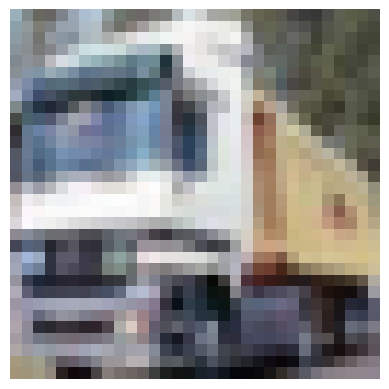

In [3]:
def display_rgb_image(image, normalize=True):
    # Convert tensor to numpy if needed
    if hasattr(image, 'numpy'):
        image = image.numpy()
    
    # Normalize from [-1, 1] to [0, 1] if needed
    if normalize:
        image = (image + 1.0) / 2.0
    
    # Clip values to valid range [0, 1]
    image = np.clip(image, 0, 1)
    
    plt.imshow(image)
    plt.axis('off')
    plt.show()

display_rgb_image(X_train[1])



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16384)          │     1,638,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16384)          │        65,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 8, 8, 128)      │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 16, 16, 64)     │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 32, 32, 3)      │         4,800 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,733,504 (10.43 MB)

 Trainable params: 2,700,352 (10.30 MB)

 Non-trainable params: 33,152 (129.50 KB)

(1, 32, 32, 3)


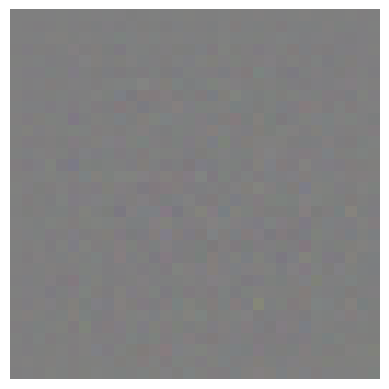

In [4]:
from tensorflow.keras import layers

noise_shape = (100,)
img_shape = (32,32,3)

def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Input(shape=noise_shape))

    model.add(layers.Dense(8*8*256, use_bias=False))
    assert model.output_shape == (None, 8*8*256)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256)

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 32, 32, 3)
    
    model.summary()

    return model

generator = make_generator_model()

noise = tf.random.normal([1, 100])
fake_image = generator(noise, training=False)

print(fake_image.shape)
display_rgb_image(fake_image[0])



In [5]:
def make_discriminator_model():
    model = Sequential()
    model.add(layers.Input(shape=img_shape))
    
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    assert model.output_shape == (None, 4, 4, 256)
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    
    model.summary()
    
    return model

discriminator = make_discriminator_model()
validity = discriminator(fake_image, training=False)

print(validity)

/Users/buudinhha/PycharmProjects/deep-learning-2/tf_keras_env/lib/python3.12/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 16, 16, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 8, 8, 128)      │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 256)      │       819,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         4,097 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,033,345 (3.94 MB)

 Trainable params: 1,033,345 (3.94 MB)

 Non-trainable params: 0 (0.00 B)

tf.Tensor([[-0.00057626]], shape=(1, 1), dtype=float32)


In [6]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [7]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [8]:
noise_dim = 100

@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss

In [9]:
def print_imgs():
    r, c = 2, 10  # 2 rows, 10 columns = 20 images
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator.predict(noise, verbose=0)

    # Normalize from [-1, 1] to [0, 1] for display
    gen_imgs = (gen_imgs + 1.0) / 2.0
    gen_imgs = np.clip(gen_imgs, 0, 1)
    
    fig, axs = plt.subplots(r, c, figsize=(20, 4))
    cnt = 0
    for i in range(r):
        for j in range(c):
            # CIFAR-10 is RGB (3 channels), so no need for cmap='gray'
            # Just use the full image array
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i,j].axis('off')
            cnt += 1
    plt.tight_layout()
    plt.show()
    plt.close()

2025-11-30 14:21:59.781810: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


0 [D loss: 0.6972] [G loss: 1.3922]


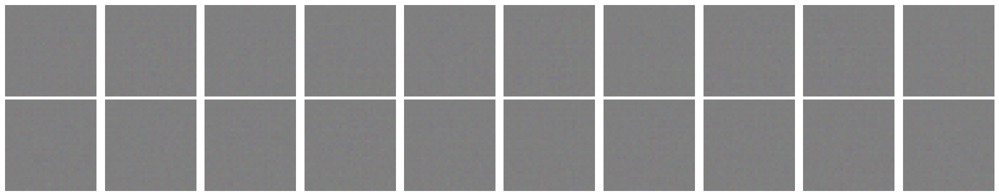

10 [D loss: 0.7412] [G loss: 1.2302]
20 [D loss: 0.7299] [G loss: 1.1422]
30 [D loss: 1.0235] [G loss: 0.9183]
40 [D loss: 1.4488] [G loss: 0.5497]
50 [D loss: 2.2325] [G loss: 0.3100]
60 [D loss: 2.6217] [G loss: 0.3313]
70 [D loss: 3.2182] [G loss: 0.2554]
80 [D loss: 3.5652] [G loss: 0.1918]
90 [D loss: 3.8358] [G loss: 0.1614]
100 [D loss: 3.4087] [G loss: 0.1053]


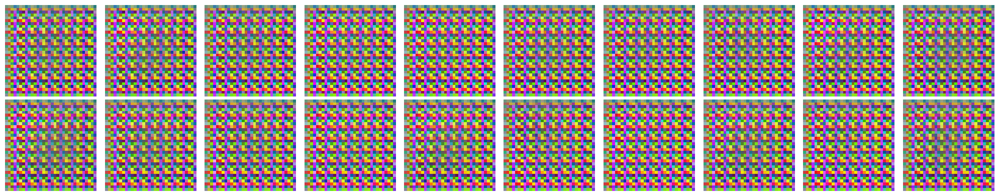

110 [D loss: 4.0934] [G loss: 0.0689]
120 [D loss: 4.1600] [G loss: 0.0541]
130 [D loss: 5.0780] [G loss: 0.1237]
140 [D loss: 3.7501] [G loss: 0.3926]
150 [D loss: 4.6816] [G loss: 0.4921]
160 [D loss: 5.5174] [G loss: 0.1707]
170 [D loss: 3.3124] [G loss: 0.5038]
180 [D loss: 1.9606] [G loss: 0.7050]
190 [D loss: 4.1530] [G loss: 0.1737]
200 [D loss: 2.9840] [G loss: 0.4736]


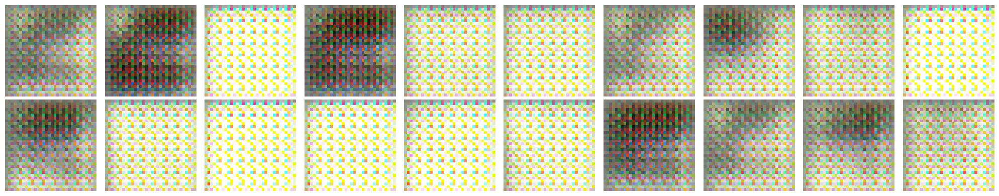

210 [D loss: 3.6056] [G loss: 0.6185]
220 [D loss: 5.6129] [G loss: 0.0499]
230 [D loss: 5.0186] [G loss: 0.0574]
240 [D loss: 3.7025] [G loss: 0.2136]
250 [D loss: 3.0304] [G loss: 0.3140]
260 [D loss: 3.4550] [G loss: 0.1101]
270 [D loss: 3.5336] [G loss: 0.1477]
280 [D loss: 4.0978] [G loss: 0.1979]
290 [D loss: 4.3954] [G loss: 0.1220]
300 [D loss: 4.5354] [G loss: 0.1369]


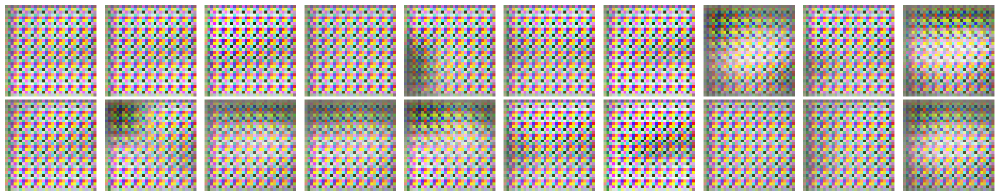

310 [D loss: 5.9695] [G loss: 0.0457]
320 [D loss: 5.2313] [G loss: 0.1186]
330 [D loss: 4.8868] [G loss: 0.1056]
340 [D loss: 4.6634] [G loss: 0.0875]
350 [D loss: 5.4862] [G loss: 0.1050]
360 [D loss: 5.9390] [G loss: 0.0985]
370 [D loss: 5.8384] [G loss: 0.0624]
380 [D loss: 3.8418] [G loss: 0.2592]
390 [D loss: 4.1575] [G loss: 0.2857]
400 [D loss: 4.3205] [G loss: 0.1639]


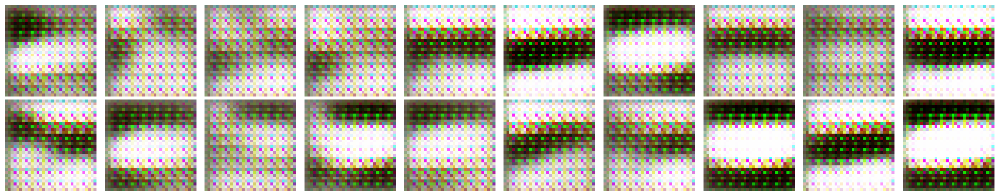

410 [D loss: 4.8367] [G loss: 0.1133]
420 [D loss: 4.9831] [G loss: 0.2175]
430 [D loss: 4.7431] [G loss: 0.1918]
440 [D loss: 7.2575] [G loss: 0.2056]
450 [D loss: 5.8968] [G loss: 0.1407]
460 [D loss: 4.8319] [G loss: 0.1833]
470 [D loss: 5.1822] [G loss: 0.3191]
480 [D loss: 7.5517] [G loss: 0.1561]
490 [D loss: 7.7386] [G loss: 0.1339]
500 [D loss: 9.3841] [G loss: 0.1066]


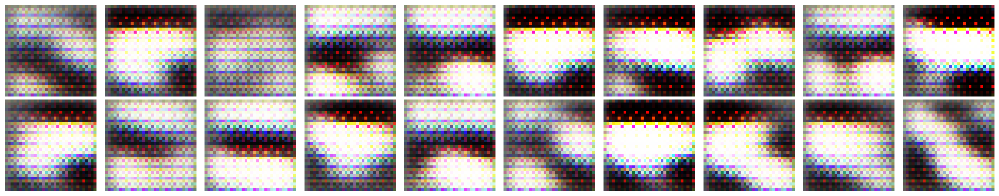

510 [D loss: 7.0870] [G loss: 0.1908]
520 [D loss: 6.2691] [G loss: 0.1353]
530 [D loss: 6.8363] [G loss: 0.2437]
540 [D loss: 4.3618] [G loss: 0.3883]
550 [D loss: 4.9898] [G loss: 0.5297]
560 [D loss: 4.7368] [G loss: 0.3945]
570 [D loss: 4.3244] [G loss: 0.3199]
580 [D loss: 4.0748] [G loss: 0.1758]
590 [D loss: 4.2565] [G loss: 0.1323]
600 [D loss: 4.1650] [G loss: 0.3363]


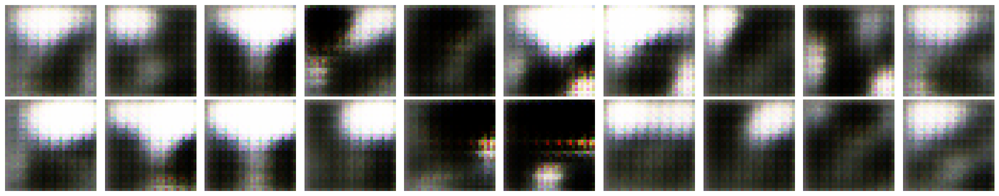

610 [D loss: 3.5558] [G loss: 0.3016]
620 [D loss: 4.3432] [G loss: 0.1831]
630 [D loss: 4.3532] [G loss: 0.1917]
640 [D loss: 5.1728] [G loss: 0.2115]
650 [D loss: 6.1308] [G loss: 0.2018]
660 [D loss: 5.2950] [G loss: 0.1781]
670 [D loss: 5.5404] [G loss: 0.1795]
680 [D loss: 3.3668] [G loss: 0.4747]
690 [D loss: 3.4579] [G loss: 0.4363]
700 [D loss: 4.0444] [G loss: 0.4970]


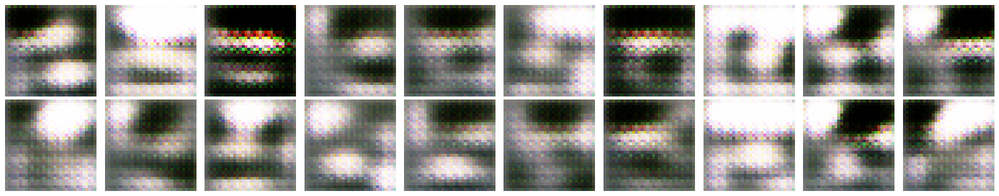

710 [D loss: 4.4450] [G loss: 0.3482]
720 [D loss: 3.6999] [G loss: 0.3167]
730 [D loss: 3.6879] [G loss: 0.3598]
740 [D loss: 3.8306] [G loss: 0.3476]
750 [D loss: 4.2389] [G loss: 0.2085]
760 [D loss: 3.5629] [G loss: 0.2271]
770 [D loss: 4.1959] [G loss: 0.3311]
780 [D loss: 3.5271] [G loss: 0.3145]
790 [D loss: 3.9125] [G loss: 0.3906]
800 [D loss: 4.3748] [G loss: 0.2748]


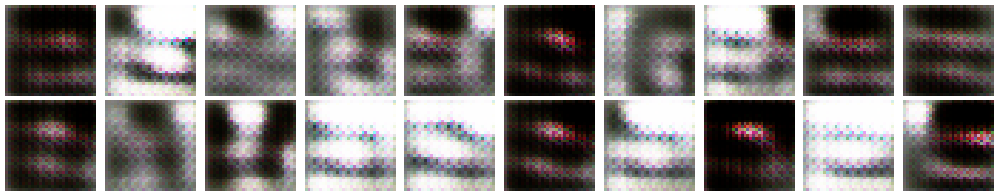

810 [D loss: 3.3069] [G loss: 0.2534]
820 [D loss: 4.0755] [G loss: 0.2680]
830 [D loss: 3.8797] [G loss: 0.2066]
840 [D loss: 3.6415] [G loss: 0.1606]
850 [D loss: 4.6779] [G loss: 0.1075]
860 [D loss: 3.9587] [G loss: 0.1644]
870 [D loss: 3.8104] [G loss: 0.1559]
880 [D loss: 4.4148] [G loss: 0.1654]
890 [D loss: 4.3503] [G loss: 0.1764]
900 [D loss: 3.5302] [G loss: 0.3340]


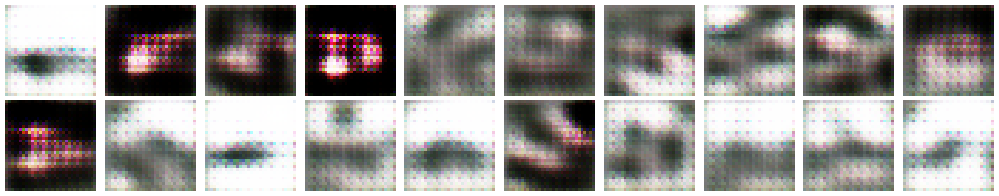

910 [D loss: 3.2063] [G loss: 0.3285]
920 [D loss: 3.1337] [G loss: 0.3023]
930 [D loss: 4.1804] [G loss: 0.1658]
940 [D loss: 3.9572] [G loss: 0.1535]
950 [D loss: 4.4181] [G loss: 0.2057]
960 [D loss: 4.1645] [G loss: 0.2581]
970 [D loss: 3.5447] [G loss: 0.3169]
980 [D loss: 3.4354] [G loss: 0.3519]
990 [D loss: 3.8473] [G loss: 0.1442]
1000 [D loss: 4.2065] [G loss: 0.1983]


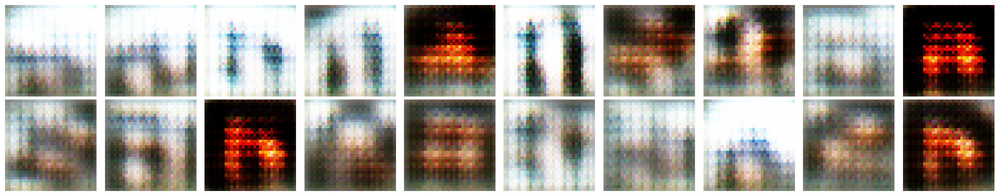

1010 [D loss: 3.3799] [G loss: 0.3258]
1020 [D loss: 3.2964] [G loss: 0.3007]
1030 [D loss: 3.8118] [G loss: 0.2396]
1040 [D loss: 3.5039] [G loss: 0.4578]
1050 [D loss: 3.9945] [G loss: 0.3114]
1060 [D loss: 5.3048] [G loss: 0.2362]
1070 [D loss: 4.1953] [G loss: 0.4937]
1080 [D loss: 2.7076] [G loss: 0.5342]
1090 [D loss: 3.2648] [G loss: 0.4967]
1100 [D loss: 3.2809] [G loss: 0.4849]


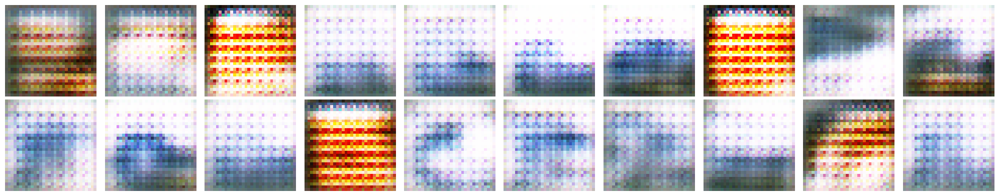

1110 [D loss: 3.6618] [G loss: 0.4028]
1120 [D loss: 3.9671] [G loss: 0.1629]
1130 [D loss: 3.9462] [G loss: 0.2416]
1140 [D loss: 3.8609] [G loss: 0.1450]
1150 [D loss: 4.3469] [G loss: 0.1159]
1160 [D loss: 4.5897] [G loss: 0.2115]
1170 [D loss: 4.7996] [G loss: 0.2379]
1180 [D loss: 4.1502] [G loss: 0.3476]
1190 [D loss: 3.7876] [G loss: 0.3976]
1200 [D loss: 4.2182] [G loss: 0.2573]


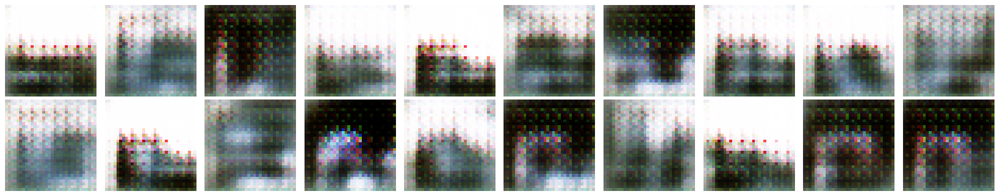

1210 [D loss: 3.5311] [G loss: 0.2228]
1220 [D loss: 3.4342] [G loss: 0.1758]
1230 [D loss: 4.5129] [G loss: 0.1458]
1240 [D loss: 3.0759] [G loss: 0.4291]
1250 [D loss: 4.6022] [G loss: 0.3712]
1260 [D loss: 3.6484] [G loss: 0.3030]
1270 [D loss: 3.9548] [G loss: 0.4177]
1280 [D loss: 4.1214] [G loss: 0.2472]
1290 [D loss: 3.8884] [G loss: 0.3923]
1300 [D loss: 4.2598] [G loss: 0.2923]


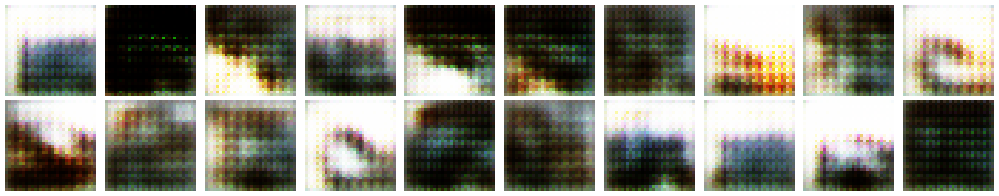

1310 [D loss: 4.0001] [G loss: 0.2499]
1320 [D loss: 3.9663] [G loss: 0.1973]
1330 [D loss: 4.1193] [G loss: 0.2539]
1340 [D loss: 4.1049] [G loss: 0.2601]
1350 [D loss: 4.1672] [G loss: 0.2909]
1360 [D loss: 4.7437] [G loss: 0.4628]
1370 [D loss: 3.5839] [G loss: 0.3621]
1380 [D loss: 4.1344] [G loss: 0.2929]
1390 [D loss: 3.3709] [G loss: 0.4428]
1400 [D loss: 3.1618] [G loss: 0.4272]


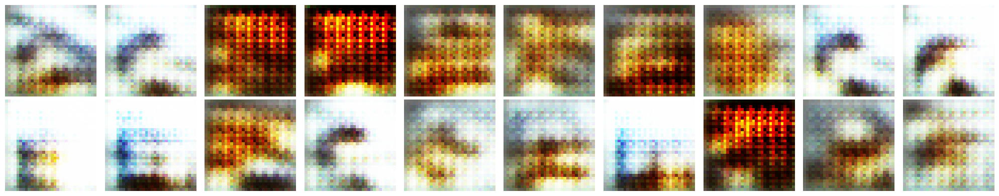

1410 [D loss: 4.3137] [G loss: 0.1882]
1420 [D loss: 3.8596] [G loss: 0.2456]
1430 [D loss: 3.3218] [G loss: 0.3080]
1440 [D loss: 4.0383] [G loss: 0.1827]
1450 [D loss: 3.7369] [G loss: 0.2461]
1460 [D loss: 3.7548] [G loss: 0.2390]
1470 [D loss: 5.2928] [G loss: 0.1608]
1480 [D loss: 4.1946] [G loss: 0.2998]
1490 [D loss: 3.3488] [G loss: 0.4213]
1500 [D loss: 3.6260] [G loss: 0.3566]


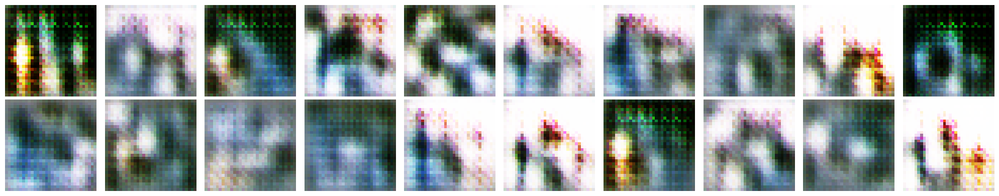

1510 [D loss: 4.0821] [G loss: 0.2046]
1520 [D loss: 4.0444] [G loss: 0.1280]
1530 [D loss: 3.7649] [G loss: 0.3025]
1540 [D loss: 4.1285] [G loss: 0.4282]
1550 [D loss: 2.9733] [G loss: 0.2678]
1560 [D loss: 3.6272] [G loss: 0.2151]
1570 [D loss: 4.2671] [G loss: 0.2794]
1580 [D loss: 3.8425] [G loss: 0.2570]
1590 [D loss: 4.4751] [G loss: 0.1394]
1600 [D loss: 3.8187] [G loss: 0.3062]


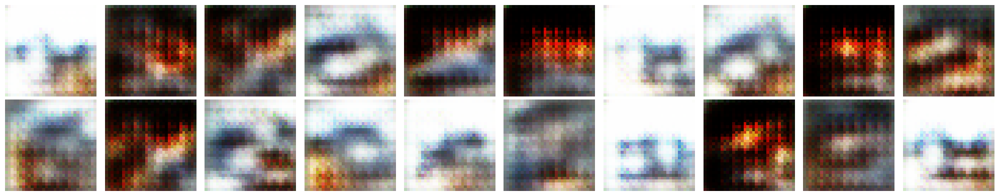

1610 [D loss: 3.6971] [G loss: 0.5766]
1620 [D loss: 2.9473] [G loss: 0.4204]
1630 [D loss: 3.1162] [G loss: 0.3483]
1640 [D loss: 4.0745] [G loss: 0.2333]
1650 [D loss: 3.9357] [G loss: 0.3287]
1660 [D loss: 3.2813] [G loss: 0.3043]
1670 [D loss: 4.1237] [G loss: 0.2017]
1680 [D loss: 4.3367] [G loss: 0.2833]
1690 [D loss: 4.3696] [G loss: 0.2195]
1700 [D loss: 5.6174] [G loss: 0.1133]


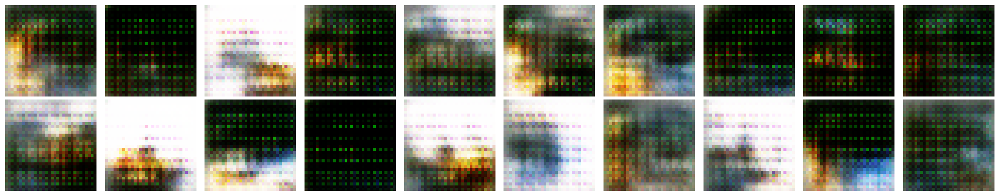

1710 [D loss: 4.9927] [G loss: 0.1808]
1720 [D loss: 5.0749] [G loss: 0.1919]
1730 [D loss: 4.1352] [G loss: 0.2852]
1740 [D loss: 3.5397] [G loss: 0.3638]
1750 [D loss: 4.7618] [G loss: 0.3013]
1760 [D loss: 3.9090] [G loss: 0.3053]
1770 [D loss: 4.3122] [G loss: 0.3555]
1780 [D loss: 3.8638] [G loss: 0.3140]
1790 [D loss: 3.7234] [G loss: 0.2960]
1800 [D loss: 4.5148] [G loss: 0.3024]


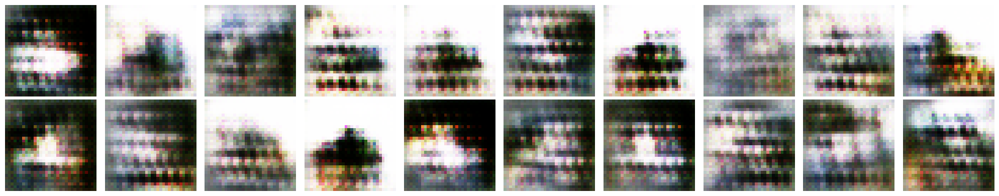

1810 [D loss: 3.6824] [G loss: 0.5084]
1820 [D loss: 3.1197] [G loss: 0.4580]
1830 [D loss: 3.6425] [G loss: 0.4284]
1840 [D loss: 4.1843] [G loss: 0.2894]
1850 [D loss: 3.9010] [G loss: 0.3145]
1860 [D loss: 4.1004] [G loss: 0.3549]
1870 [D loss: 3.5263] [G loss: 0.3111]
1880 [D loss: 3.8022] [G loss: 0.2132]
1890 [D loss: 3.9979] [G loss: 0.2397]
1900 [D loss: 4.1823] [G loss: 0.3686]


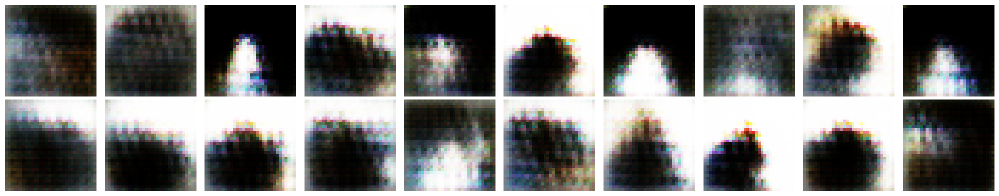

1910 [D loss: 4.1614] [G loss: 0.4485]
1920 [D loss: 3.6054] [G loss: 0.2502]
1930 [D loss: 3.7771] [G loss: 0.2272]
1940 [D loss: 2.9428] [G loss: 0.3807]
1950 [D loss: 3.6365] [G loss: 0.3588]
1960 [D loss: 3.7624] [G loss: 0.2857]
1970 [D loss: 2.9619] [G loss: 0.3793]
1980 [D loss: 2.7218] [G loss: 0.4174]
1990 [D loss: 3.7925] [G loss: 0.1922]
2000 [D loss: 4.1315] [G loss: 0.2283]


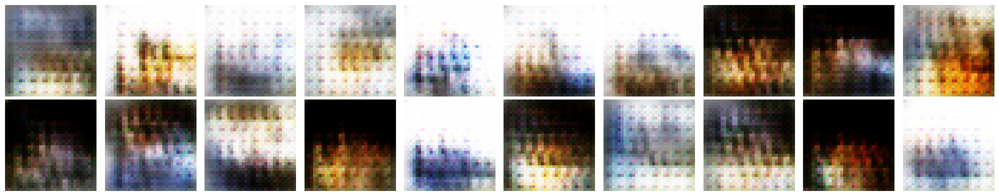

2010 [D loss: 3.8517] [G loss: 0.3014]
2020 [D loss: 3.7513] [G loss: 0.3628]
2030 [D loss: 3.9624] [G loss: 0.4548]
2040 [D loss: 3.5520] [G loss: 0.5625]
2050 [D loss: 3.8532] [G loss: 0.1858]
2060 [D loss: 2.9750] [G loss: 0.4768]
2070 [D loss: 2.6955] [G loss: 0.7496]
2080 [D loss: 3.4209] [G loss: 0.3725]
2090 [D loss: 3.2299] [G loss: 0.3563]
2100 [D loss: 3.0520] [G loss: 0.3499]


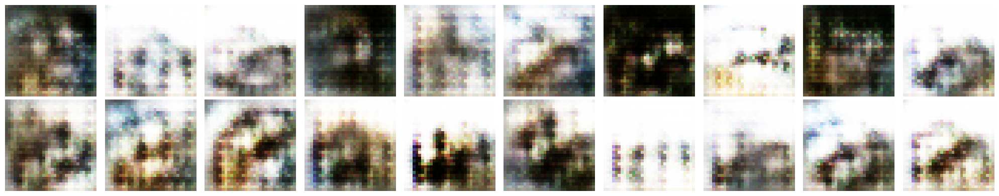

2110 [D loss: 3.1169] [G loss: 0.4622]
2120 [D loss: 2.9780] [G loss: 0.3578]
2130 [D loss: 3.1442] [G loss: 0.3400]
2140 [D loss: 3.6431] [G loss: 0.2040]
2150 [D loss: 3.3113] [G loss: 0.3979]
2160 [D loss: 3.5874] [G loss: 0.4367]
2170 [D loss: 3.9212] [G loss: 0.4075]
2180 [D loss: 3.1097] [G loss: 0.4277]
2190 [D loss: 3.2512] [G loss: 0.3771]
2200 [D loss: 2.9431] [G loss: 0.4313]


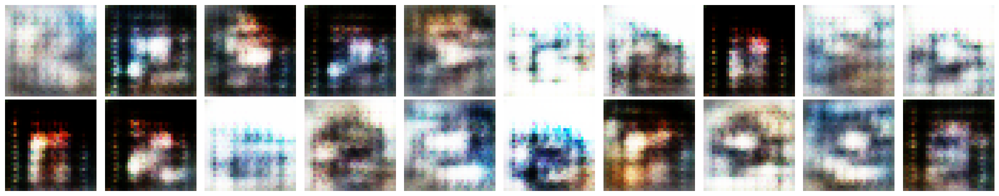

2210 [D loss: 2.7897] [G loss: 0.3150]
2220 [D loss: 3.4290] [G loss: 0.3144]
2230 [D loss: 2.9839] [G loss: 0.3798]
2240 [D loss: 3.2035] [G loss: 0.3110]
2250 [D loss: 4.1330] [G loss: 0.3061]
2260 [D loss: 4.3558] [G loss: 0.2257]
2270 [D loss: 3.6686] [G loss: 0.4575]
2280 [D loss: 3.2670] [G loss: 0.4951]
2290 [D loss: 3.5925] [G loss: 0.4230]
2300 [D loss: 4.6700] [G loss: 0.2445]


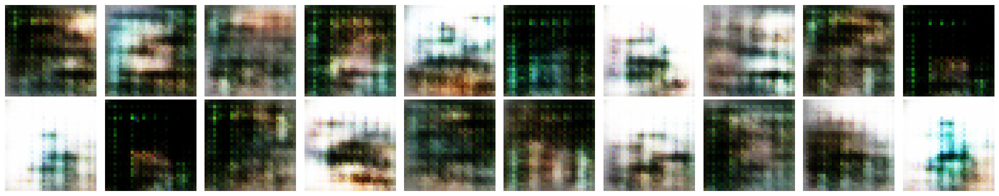

2310 [D loss: 4.6476] [G loss: 0.3339]
2320 [D loss: 3.8934] [G loss: 0.3428]
2330 [D loss: 3.0421] [G loss: 0.3793]
2340 [D loss: 3.0965] [G loss: 0.4125]
2350 [D loss: 2.9968] [G loss: 0.5487]
2360 [D loss: 2.9316] [G loss: 0.5546]
2370 [D loss: 2.6818] [G loss: 0.4053]
2380 [D loss: 3.9524] [G loss: 0.3368]
2390 [D loss: 3.6693] [G loss: 0.2665]
2400 [D loss: 3.2654] [G loss: 0.4081]


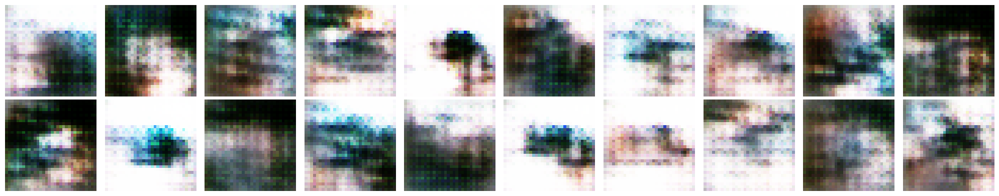

2410 [D loss: 3.3759] [G loss: 0.3134]
2420 [D loss: 3.1762] [G loss: 0.2340]
2430 [D loss: 3.2854] [G loss: 0.3197]
2440 [D loss: 3.6166] [G loss: 0.2365]
2450 [D loss: 4.0038] [G loss: 0.2300]
2460 [D loss: 3.6648] [G loss: 0.3417]
2470 [D loss: 3.9179] [G loss: 0.3146]
2480 [D loss: 3.7964] [G loss: 0.4999]
2490 [D loss: 2.7944] [G loss: 0.5768]
2500 [D loss: 3.5939] [G loss: 0.2284]


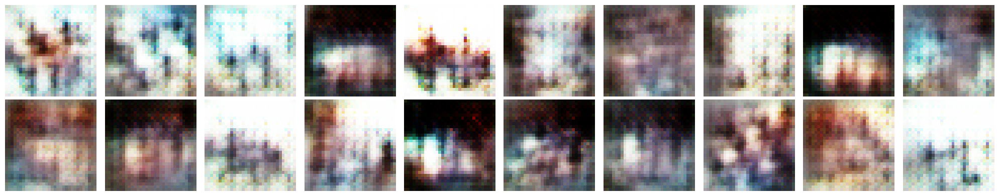

2510 [D loss: 3.3551] [G loss: 0.4185]
2520 [D loss: 3.1397] [G loss: 0.4615]
2530 [D loss: 3.2548] [G loss: 0.3565]
2540 [D loss: 3.4242] [G loss: 0.2215]
2550 [D loss: 3.8937] [G loss: 0.1952]
2560 [D loss: 4.3448] [G loss: 0.2853]
2570 [D loss: 3.7574] [G loss: 0.4579]
2580 [D loss: 3.3736] [G loss: 0.4215]
2590 [D loss: 2.9873] [G loss: 0.3752]
2600 [D loss: 3.3450] [G loss: 0.4439]


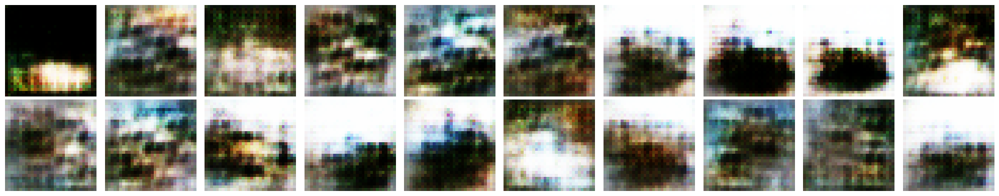

2610 [D loss: 2.8864] [G loss: 0.6735]
2620 [D loss: 2.7235] [G loss: 0.5493]
2630 [D loss: 3.2848] [G loss: 0.3164]
2640 [D loss: 2.9659] [G loss: 0.4366]
2650 [D loss: 2.9392] [G loss: 0.5682]
2660 [D loss: 2.6681] [G loss: 0.7951]
2670 [D loss: 3.2358] [G loss: 0.3440]
2680 [D loss: 3.6782] [G loss: 0.4011]
2690 [D loss: 3.3846] [G loss: 0.7255]
2700 [D loss: 2.6959] [G loss: 0.6563]


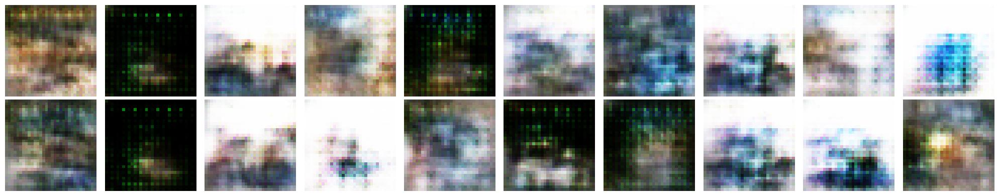

2710 [D loss: 3.1760] [G loss: 0.2442]
2720 [D loss: 3.1100] [G loss: 0.4677]
2730 [D loss: 2.1371] [G loss: 0.8935]
2740 [D loss: 2.7549] [G loss: 0.3232]
2750 [D loss: 2.9118] [G loss: 0.3723]
2760 [D loss: 3.2019] [G loss: 0.5387]
2770 [D loss: 2.3236] [G loss: 0.6628]
2780 [D loss: 3.0001] [G loss: 0.4148]
2790 [D loss: 3.5766] [G loss: 0.2250]
2800 [D loss: 3.5283] [G loss: 0.2683]


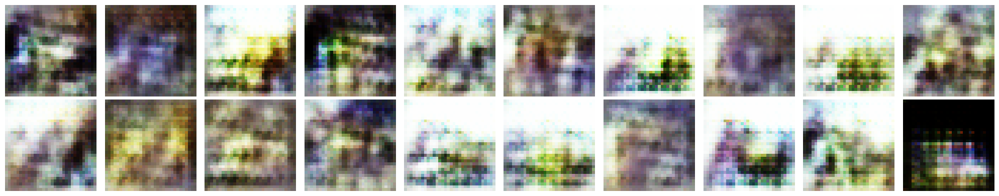

2810 [D loss: 2.6852] [G loss: 0.5902]
2820 [D loss: 2.5936] [G loss: 0.5219]
2830 [D loss: 3.1416] [G loss: 0.3311]
2840 [D loss: 3.6724] [G loss: 0.2525]
2850 [D loss: 3.3806] [G loss: 0.6567]
2860 [D loss: 2.5829] [G loss: 0.6870]
2870 [D loss: 3.4127] [G loss: 0.3997]
2880 [D loss: 2.7313] [G loss: 0.4681]
2890 [D loss: 2.5742] [G loss: 0.6773]
2900 [D loss: 3.1827] [G loss: 0.4016]


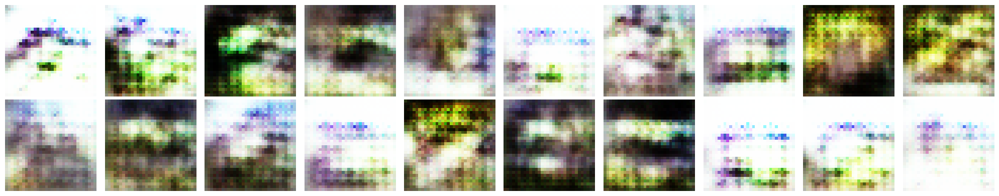

2910 [D loss: 3.8453] [G loss: 0.1660]
2920 [D loss: 3.4068] [G loss: 0.2409]
2930 [D loss: 3.5130] [G loss: 0.2444]
2940 [D loss: 3.6726] [G loss: 0.3622]
2950 [D loss: 2.9941] [G loss: 0.4095]
2960 [D loss: 3.2493] [G loss: 0.4495]
2970 [D loss: 3.7884] [G loss: 0.4160]
2980 [D loss: 3.3658] [G loss: 0.5739]
2990 [D loss: 3.0566] [G loss: 0.5653]
3000 [D loss: 3.3043] [G loss: 0.6310]


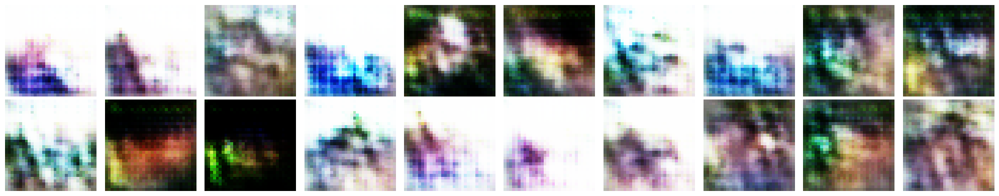

3010 [D loss: 3.9741] [G loss: 0.3352]
3020 [D loss: 3.1643] [G loss: 0.4168]
3030 [D loss: 2.6980] [G loss: 0.6213]
3040 [D loss: 2.9346] [G loss: 0.4341]
3050 [D loss: 2.8839] [G loss: 0.2948]
3060 [D loss: 3.6986] [G loss: 0.3967]
3070 [D loss: 2.5520] [G loss: 0.5006]
3080 [D loss: 2.9238] [G loss: 0.5428]
3090 [D loss: 3.0514] [G loss: 0.2573]
3100 [D loss: 4.0827] [G loss: 0.2271]


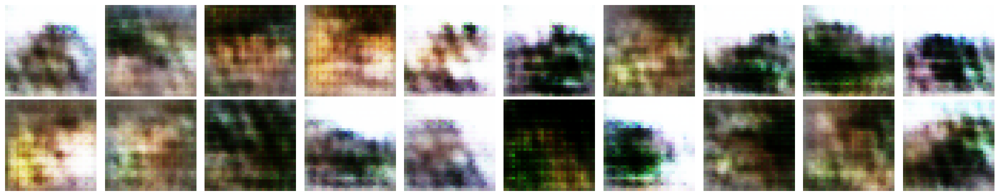

3110 [D loss: 3.4821] [G loss: 0.5692]
3120 [D loss: 2.4956] [G loss: 1.1482]
3130 [D loss: 2.5633] [G loss: 0.8151]
3140 [D loss: 3.1902] [G loss: 0.3522]
3150 [D loss: 2.9414] [G loss: 0.3820]
3160 [D loss: 2.8837] [G loss: 0.4436]
3170 [D loss: 3.0952] [G loss: 0.3437]
3180 [D loss: 3.2853] [G loss: 0.2878]
3190 [D loss: 3.2470] [G loss: 0.2813]
3200 [D loss: 3.3819] [G loss: 0.3046]


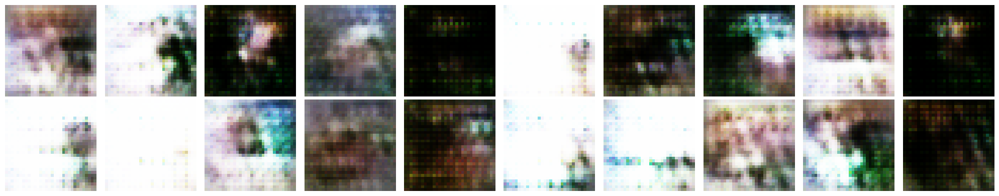

3210 [D loss: 3.4149] [G loss: 0.3168]
3220 [D loss: 3.3874] [G loss: 0.4246]
3230 [D loss: 3.2881] [G loss: 0.4741]
3240 [D loss: 2.8151] [G loss: 0.4321]
3250 [D loss: 3.1809] [G loss: 0.3467]
3260 [D loss: 2.9833] [G loss: 0.4678]
3270 [D loss: 2.9262] [G loss: 0.4607]
3280 [D loss: 2.2573] [G loss: 0.8230]
3290 [D loss: 2.7004] [G loss: 0.6089]
3300 [D loss: 3.4781] [G loss: 0.3097]


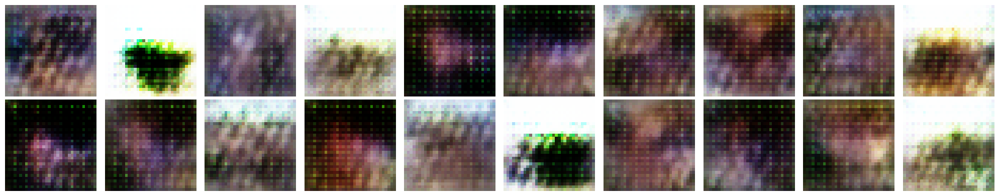

3310 [D loss: 3.4356] [G loss: 0.2915]
3320 [D loss: 3.2003] [G loss: 0.5011]
3330 [D loss: 2.6806] [G loss: 0.6408]
3340 [D loss: 2.6599] [G loss: 0.6706]
3350 [D loss: 3.0936] [G loss: 0.7089]
3360 [D loss: 3.0472] [G loss: 0.5444]
3370 [D loss: 3.4530] [G loss: 0.4170]
3380 [D loss: 3.7892] [G loss: 0.3103]
3390 [D loss: 3.3105] [G loss: 0.3024]
3400 [D loss: 3.1868] [G loss: 0.4532]


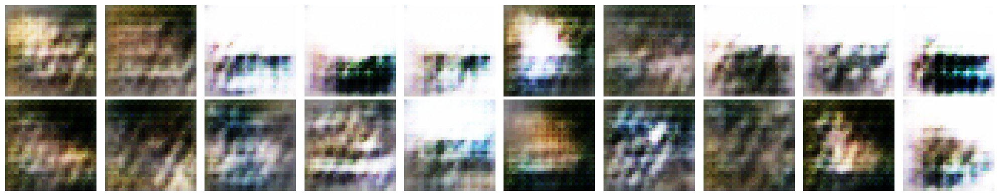

3410 [D loss: 2.8724] [G loss: 0.5654]
3420 [D loss: 2.5626] [G loss: 0.7568]
3430 [D loss: 2.4208] [G loss: 0.8151]
3440 [D loss: 3.3204] [G loss: 0.2734]
3450 [D loss: 3.6852] [G loss: 0.2791]
3460 [D loss: 2.8416] [G loss: 0.5671]
3470 [D loss: 2.3627] [G loss: 0.7678]
3480 [D loss: 2.9260] [G loss: 0.4860]
3490 [D loss: 3.0660] [G loss: 0.4710]
3500 [D loss: 2.7335] [G loss: 0.3867]


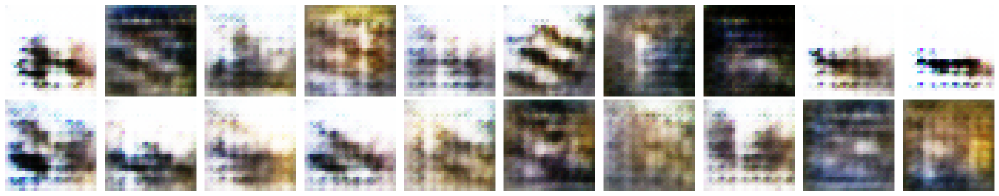

3510 [D loss: 2.7908] [G loss: 0.4031]
3520 [D loss: 2.7891] [G loss: 0.5488]
3530 [D loss: 2.7240] [G loss: 0.5721]
3540 [D loss: 3.1662] [G loss: 0.4389]
3550 [D loss: 2.6467] [G loss: 0.5157]
3560 [D loss: 3.2265] [G loss: 0.4524]
3570 [D loss: 2.6152] [G loss: 0.6219]
3580 [D loss: 2.7839] [G loss: 0.5124]
3590 [D loss: 3.1448] [G loss: 0.3486]
3600 [D loss: 3.7302] [G loss: 0.1937]


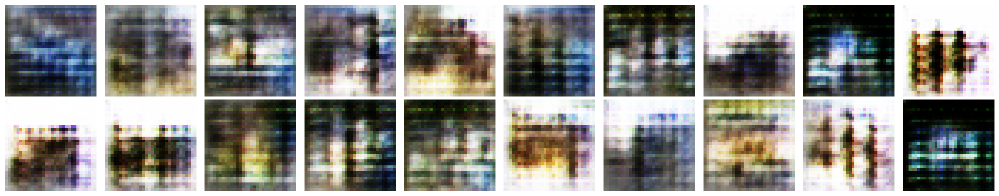

3610 [D loss: 3.6343] [G loss: 0.2139]
3620 [D loss: 3.7398] [G loss: 0.3279]
3630 [D loss: 3.6355] [G loss: 0.6365]
3640 [D loss: 3.7692] [G loss: 0.5273]
3650 [D loss: 2.8385] [G loss: 0.6684]
3660 [D loss: 2.9936] [G loss: 0.7945]
3670 [D loss: 2.4178] [G loss: 0.7630]
3680 [D loss: 3.6063] [G loss: 0.4748]
3690 [D loss: 3.3524] [G loss: 0.3321]
3700 [D loss: 3.2413] [G loss: 0.4879]


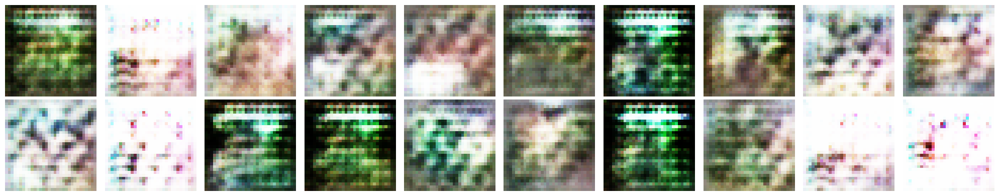

3710 [D loss: 2.8520] [G loss: 0.5116]
3720 [D loss: 3.0849] [G loss: 0.5495]
3730 [D loss: 3.5935] [G loss: 0.4475]
3740 [D loss: 3.8811] [G loss: 0.3278]
3750 [D loss: 3.8819] [G loss: 0.3806]
3760 [D loss: 3.4827] [G loss: 0.4633]
3770 [D loss: 3.2035] [G loss: 0.7638]
3780 [D loss: 2.8633] [G loss: 0.6580]
3790 [D loss: 2.8688] [G loss: 0.5730]
3800 [D loss: 2.4860] [G loss: 0.5874]


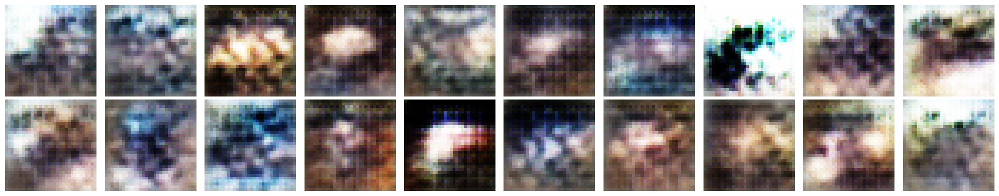

3810 [D loss: 2.5887] [G loss: 0.6458]
3820 [D loss: 2.5811] [G loss: 0.5157]
3830 [D loss: 2.7261] [G loss: 0.4139]
3840 [D loss: 2.8222] [G loss: 0.4157]
3850 [D loss: 2.9332] [G loss: 0.3945]
3860 [D loss: 2.5121] [G loss: 0.6414]
3870 [D loss: 2.2038] [G loss: 0.6342]
3880 [D loss: 2.4355] [G loss: 0.6410]
3890 [D loss: 2.6415] [G loss: 0.6325]
3900 [D loss: 2.2198] [G loss: 0.7284]


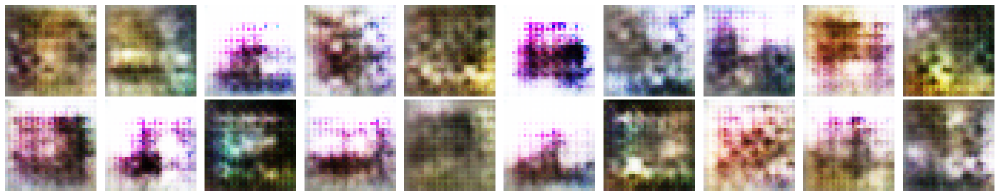

3910 [D loss: 2.8831] [G loss: 0.4652]
3920 [D loss: 3.2309] [G loss: 0.2448]
3930 [D loss: 2.9424] [G loss: 0.3703]
3940 [D loss: 2.7275] [G loss: 0.4919]
3950 [D loss: 2.7555] [G loss: 0.3758]
3960 [D loss: 3.6149] [G loss: 0.2858]
3970 [D loss: 3.8673] [G loss: 0.3132]
3980 [D loss: 2.8564] [G loss: 0.5130]
3990 [D loss: 2.5080] [G loss: 0.6946]
4000 [D loss: 2.4752] [G loss: 0.6029]


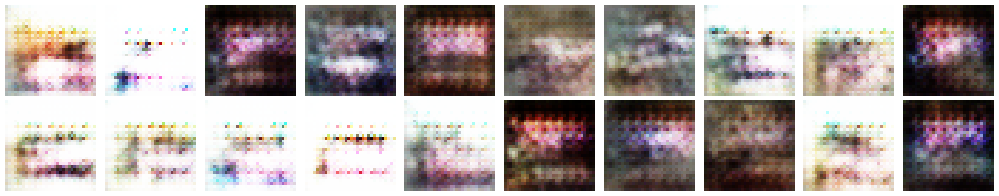

4010 [D loss: 3.4215] [G loss: 0.2476]
4020 [D loss: 3.3034] [G loss: 0.2836]
4030 [D loss: 3.1213] [G loss: 0.4039]
4040 [D loss: 3.0988] [G loss: 0.5402]
4050 [D loss: 3.5907] [G loss: 0.3164]
4060 [D loss: 4.1284] [G loss: 0.3646]
4070 [D loss: 3.6376] [G loss: 0.5190]
4080 [D loss: 3.6376] [G loss: 0.5161]
4090 [D loss: 4.3462] [G loss: 0.6518]
4100 [D loss: 3.2585] [G loss: 0.4577]


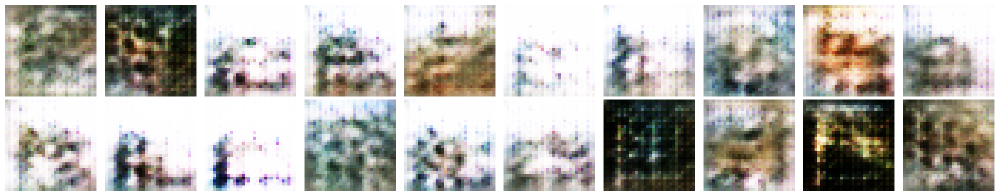

4110 [D loss: 2.8327] [G loss: 0.6723]
4120 [D loss: 2.2361] [G loss: 0.8598]
4130 [D loss: 3.5845] [G loss: 0.3119]
4140 [D loss: 3.8002] [G loss: 0.2436]
4150 [D loss: 3.5537] [G loss: 0.4418]
4160 [D loss: 3.3278] [G loss: 0.6574]
4170 [D loss: 2.4356] [G loss: 0.7313]
4180 [D loss: 2.3405] [G loss: 1.0236]
4190 [D loss: 2.6298] [G loss: 0.9864]
4200 [D loss: 3.5009] [G loss: 0.3770]


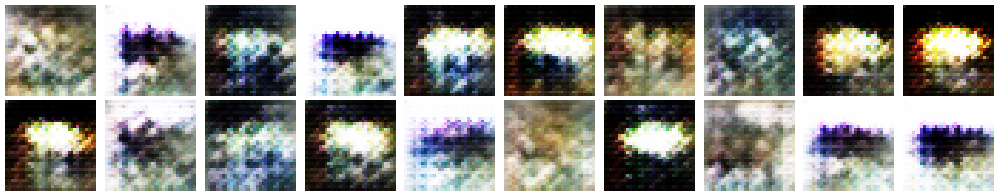

4210 [D loss: 3.2758] [G loss: 0.5360]
4220 [D loss: 3.7879] [G loss: 0.5494]
4230 [D loss: 3.4393] [G loss: 0.3564]
4240 [D loss: 4.4048] [G loss: 0.2354]
4250 [D loss: 4.0285] [G loss: 0.4403]
4260 [D loss: 3.6159] [G loss: 0.6180]
4270 [D loss: 4.1187] [G loss: 0.3131]
4280 [D loss: 3.7344] [G loss: 0.5333]
4290 [D loss: 3.1029] [G loss: 0.5892]
4300 [D loss: 3.6167] [G loss: 0.2616]


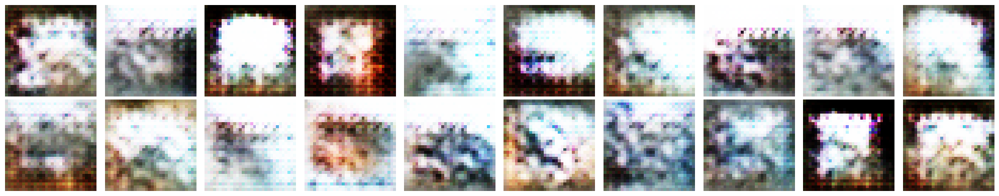

4310 [D loss: 3.5060] [G loss: 0.3997]
4320 [D loss: 2.7561] [G loss: 0.6187]
4330 [D loss: 2.5766] [G loss: 0.5954]
4340 [D loss: 3.0476] [G loss: 0.4575]
4350 [D loss: 3.1470] [G loss: 0.4287]
4360 [D loss: 3.1652] [G loss: 0.5110]
4370 [D loss: 2.8827] [G loss: 0.6777]
4380 [D loss: 2.9991] [G loss: 0.5852]
4390 [D loss: 3.0604] [G loss: 0.5736]
4400 [D loss: 2.6059] [G loss: 0.5851]


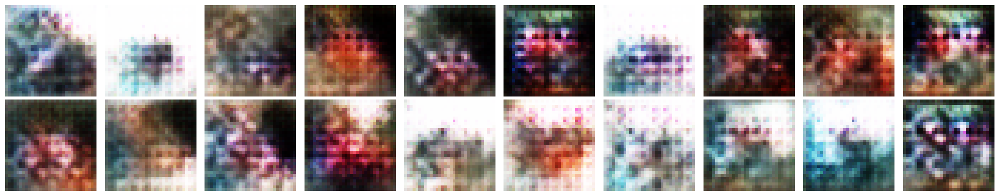

4410 [D loss: 2.5198] [G loss: 0.6091]
4420 [D loss: 2.8244] [G loss: 0.5819]
4430 [D loss: 3.0998] [G loss: 0.3367]
4440 [D loss: 3.4300] [G loss: 0.2923]
4450 [D loss: 3.3072] [G loss: 0.3877]
4460 [D loss: 2.7772] [G loss: 0.5739]
4470 [D loss: 2.6826] [G loss: 0.5918]
4480 [D loss: 2.5103] [G loss: 0.4270]
4490 [D loss: 3.1921] [G loss: 0.3448]
4500 [D loss: 2.9515] [G loss: 0.4583]


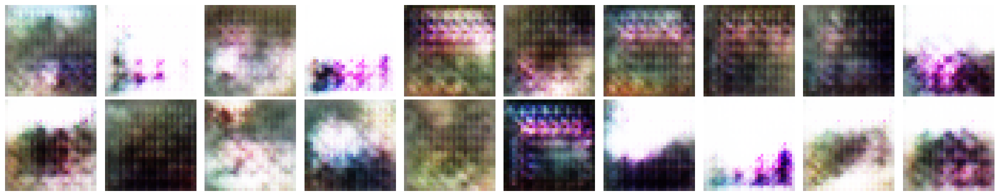

4510 [D loss: 3.3982] [G loss: 0.5585]
4520 [D loss: 3.0651] [G loss: 0.5556]
4530 [D loss: 2.8828] [G loss: 0.5520]
4540 [D loss: 2.5678] [G loss: 0.5763]
4550 [D loss: 2.1970] [G loss: 0.5008]
4560 [D loss: 3.0842] [G loss: 0.4347]
4570 [D loss: 2.9558] [G loss: 0.5583]
4580 [D loss: 1.8859] [G loss: 0.6679]
4590 [D loss: 2.4179] [G loss: 0.5832]
4600 [D loss: 2.6415] [G loss: 0.5428]


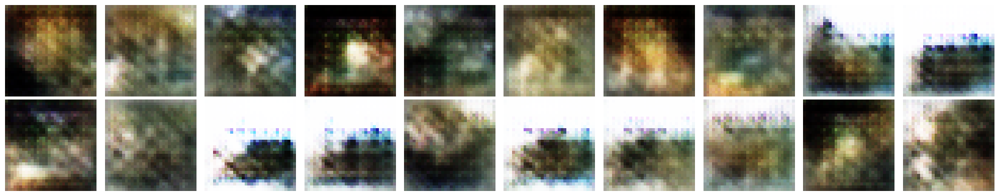

4610 [D loss: 2.4245] [G loss: 0.6661]
4620 [D loss: 2.5624] [G loss: 0.5649]
4630 [D loss: 2.4225] [G loss: 0.4577]
4640 [D loss: 2.5521] [G loss: 0.4620]
4650 [D loss: 2.8680] [G loss: 0.6355]
4660 [D loss: 2.6504] [G loss: 0.6154]
4670 [D loss: 2.8034] [G loss: 0.5782]
4680 [D loss: 2.6066] [G loss: 0.4420]
4690 [D loss: 2.5758] [G loss: 0.4005]
4700 [D loss: 3.5861] [G loss: 0.3081]


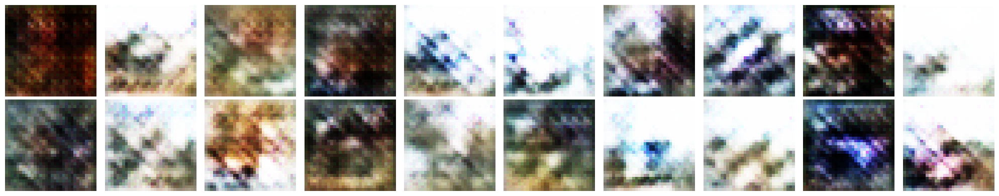

4710 [D loss: 2.9734] [G loss: 0.4071]
4720 [D loss: 2.3742] [G loss: 0.5642]
4730 [D loss: 2.6490] [G loss: 0.4197]
4740 [D loss: 3.1018] [G loss: 0.3430]
4750 [D loss: 3.2101] [G loss: 0.4730]
4760 [D loss: 3.0826] [G loss: 0.4737]
4770 [D loss: 2.9492] [G loss: 0.4769]
4780 [D loss: 3.3526] [G loss: 0.5295]
4790 [D loss: 3.3315] [G loss: 0.6189]
4800 [D loss: 3.8953] [G loss: 0.3944]


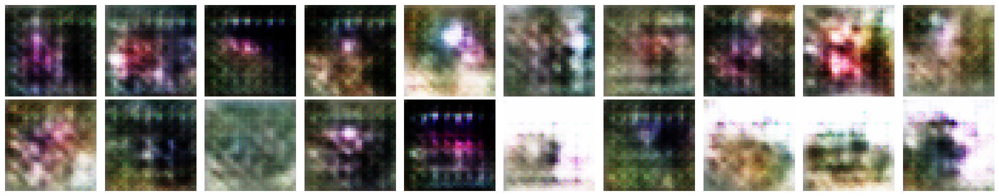

4810 [D loss: 3.0100] [G loss: 0.4348]
4820 [D loss: 2.7234] [G loss: 0.5769]
4830 [D loss: 2.9173] [G loss: 0.4642]
4840 [D loss: 2.9215] [G loss: 0.4011]
4850 [D loss: 2.9051] [G loss: 0.5837]
4860 [D loss: 2.7753] [G loss: 0.5523]
4870 [D loss: 3.2586] [G loss: 0.2968]
4880 [D loss: 2.5627] [G loss: 0.6278]
4890 [D loss: 2.2169] [G loss: 1.0311]
4900 [D loss: 3.4126] [G loss: 0.4371]


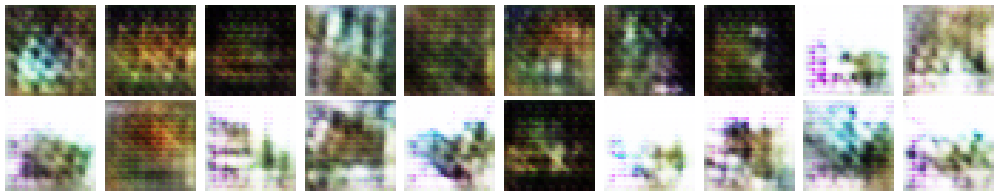

4910 [D loss: 3.6056] [G loss: 0.3132]
4920 [D loss: 2.9730] [G loss: 0.4766]
4930 [D loss: 2.7026] [G loss: 0.7548]
4940 [D loss: 3.7158] [G loss: 0.3785]
4950 [D loss: 2.7031] [G loss: 0.4830]
4960 [D loss: 3.0332] [G loss: 0.3406]
4970 [D loss: 4.0436] [G loss: 0.1444]
4980 [D loss: 3.8481] [G loss: 0.2628]
4990 [D loss: 2.5853] [G loss: 0.5083]
5000 [D loss: 3.0287] [G loss: 0.4433]


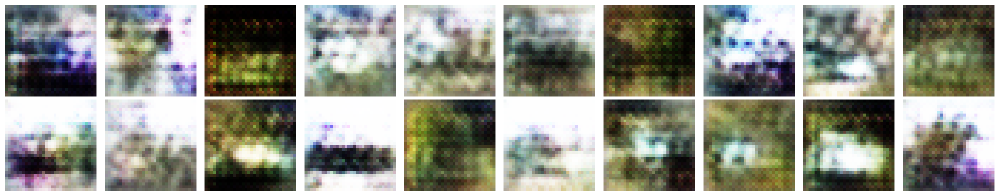

5010 [D loss: 2.7312] [G loss: 0.5261]
5020 [D loss: 2.8020] [G loss: 0.7349]
5030 [D loss: 3.9561] [G loss: 0.2820]
5040 [D loss: 4.5281] [G loss: 0.1970]
5050 [D loss: 3.6152] [G loss: 0.4005]
5060 [D loss: 2.6816] [G loss: 0.7324]
5070 [D loss: 3.2733] [G loss: 0.2771]
5080 [D loss: 4.2094] [G loss: 0.2155]
5090 [D loss: 2.4434] [G loss: 0.5662]
5100 [D loss: 4.4659] [G loss: 1.1595]


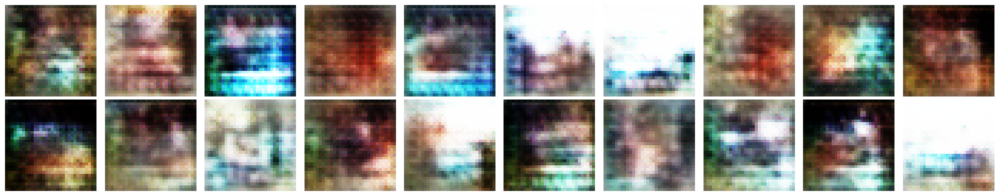

5110 [D loss: 2.7329] [G loss: 0.6700]
5120 [D loss: 3.4539] [G loss: 0.4466]
5130 [D loss: 2.9151] [G loss: 0.3866]
5140 [D loss: 3.5940] [G loss: 0.2829]
5150 [D loss: 3.0044] [G loss: 0.6248]
5160 [D loss: 2.9282] [G loss: 0.5386]
5170 [D loss: 2.1998] [G loss: 0.6388]
5180 [D loss: 3.3019] [G loss: 0.5034]
5190 [D loss: 3.5964] [G loss: 0.4591]
5200 [D loss: 2.7009] [G loss: 0.4164]


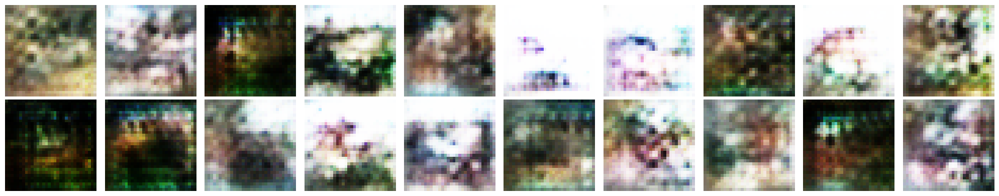

5210 [D loss: 2.2620] [G loss: 0.6203]
5220 [D loss: 2.3804] [G loss: 0.8750]
5230 [D loss: 2.5881] [G loss: 0.5667]
5240 [D loss: 2.6484] [G loss: 0.3529]
5250 [D loss: 2.6909] [G loss: 0.3855]
5260 [D loss: 2.0935] [G loss: 0.9708]
5270 [D loss: 1.6844] [G loss: 1.0882]
5280 [D loss: 2.3689] [G loss: 0.5788]
5290 [D loss: 2.6876] [G loss: 0.4093]
5300 [D loss: 2.6741] [G loss: 0.5457]


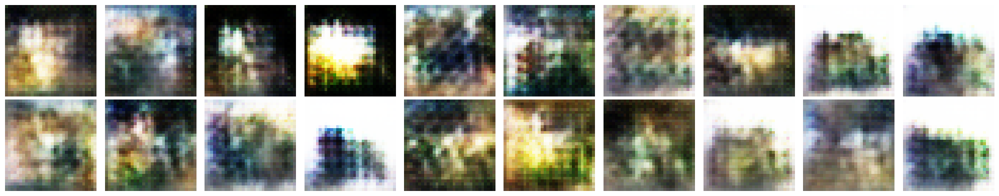

5310 [D loss: 2.5561] [G loss: 0.5778]
5320 [D loss: 2.6760] [G loss: 0.5533]
5330 [D loss: 2.8021] [G loss: 0.3931]
5340 [D loss: 2.6191] [G loss: 0.4614]
5350 [D loss: 2.9029] [G loss: 0.3719]
5360 [D loss: 2.9656] [G loss: 0.3744]
5370 [D loss: 2.7615] [G loss: 0.3973]
5380 [D loss: 2.5051] [G loss: 0.6785]
5390 [D loss: 2.1970] [G loss: 0.9011]
5400 [D loss: 2.5035] [G loss: 0.5784]


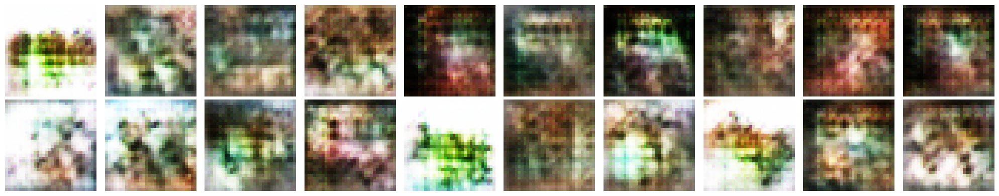

5410 [D loss: 3.0613] [G loss: 0.3376]
5420 [D loss: 2.8749] [G loss: 0.4843]
5430 [D loss: 2.4098] [G loss: 0.6127]
5440 [D loss: 2.5087] [G loss: 0.4917]
5450 [D loss: 2.6176] [G loss: 0.5084]
5460 [D loss: 2.3539] [G loss: 0.7206]
5470 [D loss: 2.5550] [G loss: 0.5503]
5480 [D loss: 2.7120] [G loss: 0.3809]
5490 [D loss: 2.3855] [G loss: 0.5231]
5500 [D loss: 1.9990] [G loss: 0.7130]


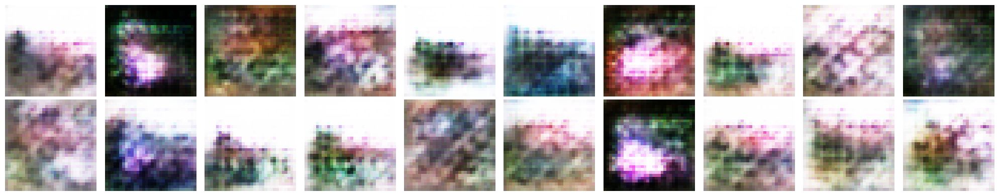

5510 [D loss: 2.4546] [G loss: 0.6751]
5520 [D loss: 2.5205] [G loss: 0.6271]
5530 [D loss: 2.5899] [G loss: 0.4314]
5540 [D loss: 2.6470] [G loss: 0.5712]
5550 [D loss: 2.4967] [G loss: 0.7430]
5560 [D loss: 2.4380] [G loss: 0.5261]
5570 [D loss: 2.8382] [G loss: 0.5735]
5580 [D loss: 2.4070] [G loss: 0.5117]
5590 [D loss: 2.5739] [G loss: 0.5133]
5600 [D loss: 2.8683] [G loss: 0.4001]


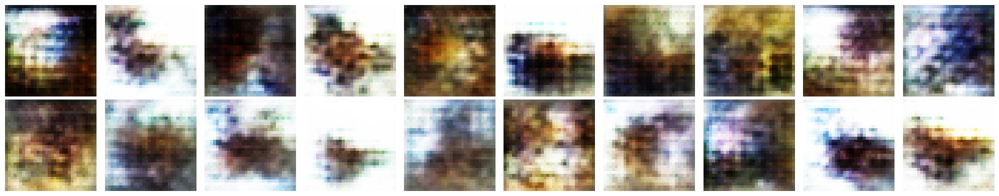

5610 [D loss: 2.6611] [G loss: 0.5574]
5620 [D loss: 2.8899] [G loss: 0.4524]
5630 [D loss: 2.8816] [G loss: 0.3435]
5640 [D loss: 2.4533] [G loss: 0.4267]
5650 [D loss: 2.4509] [G loss: 0.6200]
5660 [D loss: 2.4722] [G loss: 0.5841]
5670 [D loss: 3.1000] [G loss: 0.4554]
5680 [D loss: 2.6261] [G loss: 0.4457]
5690 [D loss: 2.4604] [G loss: 0.5007]
5700 [D loss: 2.7425] [G loss: 0.3211]


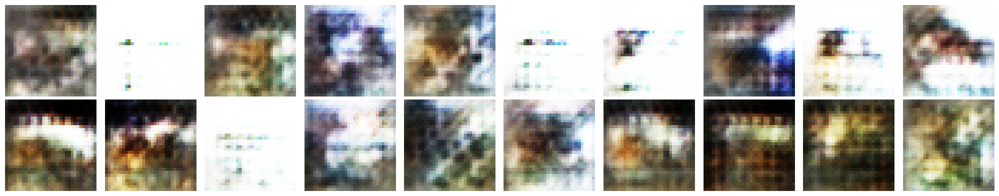

5710 [D loss: 2.9596] [G loss: 0.3120]
5720 [D loss: 3.0575] [G loss: 0.3213]
5730 [D loss: 2.7156] [G loss: 0.3538]
5740 [D loss: 2.8315] [G loss: 0.3762]
5750 [D loss: 2.8801] [G loss: 0.3663]
5760 [D loss: 2.8134] [G loss: 0.5362]
5770 [D loss: 3.0163] [G loss: 0.5792]
5780 [D loss: 2.5938] [G loss: 0.6493]
5790 [D loss: 2.6881] [G loss: 1.0021]
5800 [D loss: 2.6848] [G loss: 0.7883]


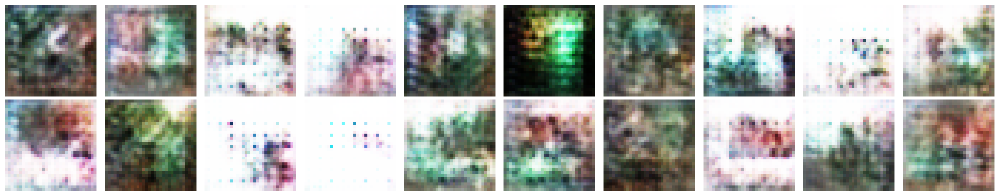

5810 [D loss: 3.2505] [G loss: 0.3509]
5820 [D loss: 3.9415] [G loss: 0.3487]
5830 [D loss: 3.4683] [G loss: 0.3863]
5840 [D loss: 3.1158] [G loss: 0.5037]
5850 [D loss: 3.1442] [G loss: 0.4222]
5860 [D loss: 2.8315] [G loss: 0.4277]
5870 [D loss: 2.5392] [G loss: 0.6747]
5880 [D loss: 2.5019] [G loss: 0.7961]
5890 [D loss: 2.1661] [G loss: 0.7493]
5900 [D loss: 2.3112] [G loss: 0.6450]


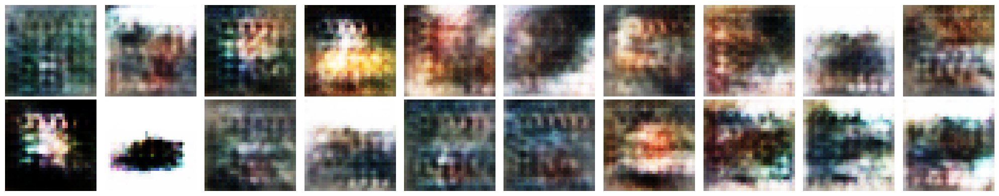

5910 [D loss: 2.2320] [G loss: 0.6177]
5920 [D loss: 2.1983] [G loss: 0.6450]
5930 [D loss: 2.1757] [G loss: 0.5946]
5940 [D loss: 2.6823] [G loss: 0.3127]
5950 [D loss: 2.6529] [G loss: 0.5806]
5960 [D loss: 2.6140] [G loss: 0.6533]
5970 [D loss: 2.7786] [G loss: 0.4990]
5980 [D loss: 2.7714] [G loss: 0.5415]
5990 [D loss: 2.5156] [G loss: 0.5492]
6000 [D loss: 2.8304] [G loss: 0.5555]


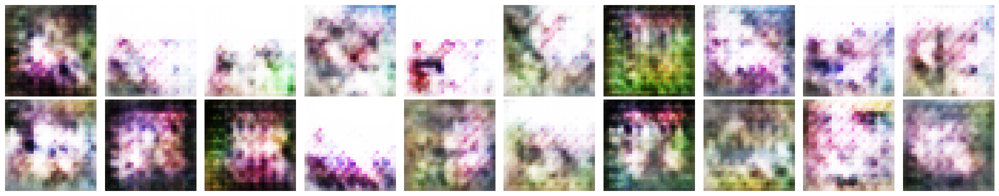

6010 [D loss: 2.6649] [G loss: 0.4969]
6020 [D loss: 2.3717] [G loss: 0.5229]
6030 [D loss: 3.0148] [G loss: 0.3243]
6040 [D loss: 2.9598] [G loss: 0.3308]
6050 [D loss: 3.1707] [G loss: 0.4940]
6060 [D loss: 3.2632] [G loss: 0.5335]
6070 [D loss: 2.7659] [G loss: 0.6732]
6080 [D loss: 3.1338] [G loss: 0.7285]
6090 [D loss: 3.1943] [G loss: 0.4774]
6100 [D loss: 3.1060] [G loss: 0.5113]


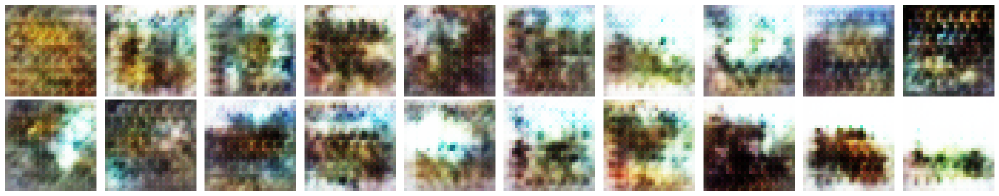

6110 [D loss: 2.8072] [G loss: 0.6323]
6120 [D loss: 2.8059] [G loss: 0.6132]
6130 [D loss: 2.6063] [G loss: 0.5133]
6140 [D loss: 3.0087] [G loss: 0.5729]
6150 [D loss: 2.8852] [G loss: 0.5494]
6160 [D loss: 3.4788] [G loss: 0.3508]
6170 [D loss: 3.2614] [G loss: 0.3221]
6180 [D loss: 3.4174] [G loss: 0.2632]
6190 [D loss: 2.5700] [G loss: 0.4526]
6200 [D loss: 3.0764] [G loss: 0.3107]


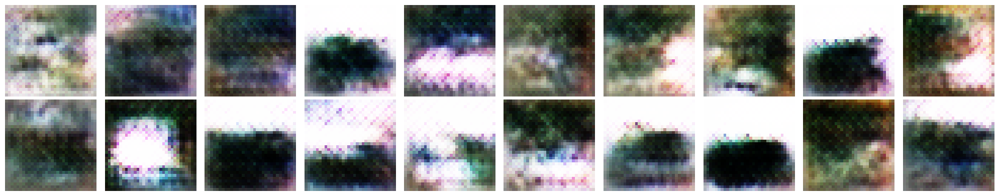

6210 [D loss: 3.5040] [G loss: 0.2845]
6220 [D loss: 3.0120] [G loss: 0.4833]
6230 [D loss: 3.0940] [G loss: 0.6000]
6240 [D loss: 2.4584] [G loss: 0.6732]
6250 [D loss: 3.1633] [G loss: 0.4866]
6260 [D loss: 2.7335] [G loss: 0.7683]
6270 [D loss: 3.4418] [G loss: 0.5529]
6280 [D loss: 3.3366] [G loss: 0.3616]
6290 [D loss: 3.8479] [G loss: 0.3616]
6300 [D loss: 3.2186] [G loss: 0.4164]


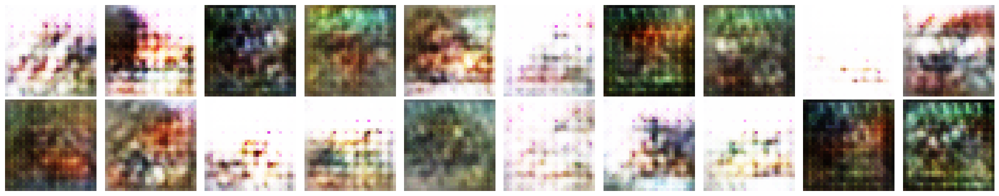

6310 [D loss: 2.8517] [G loss: 0.6764]
6320 [D loss: 2.0817] [G loss: 0.8804]
6330 [D loss: 2.3324] [G loss: 0.9080]
6340 [D loss: 2.4747] [G loss: 0.6314]
6350 [D loss: 2.5753] [G loss: 0.4917]
6360 [D loss: 2.3819] [G loss: 0.5351]
6370 [D loss: 2.8321] [G loss: 0.6511]
6380 [D loss: 2.3246] [G loss: 0.6741]
6390 [D loss: 2.2697] [G loss: 0.6206]
6400 [D loss: 2.6173] [G loss: 0.4557]


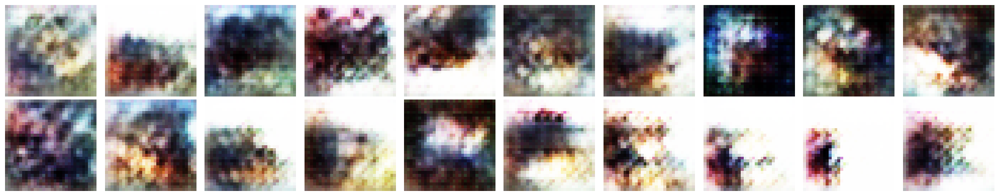

6410 [D loss: 2.9220] [G loss: 0.3862]
6420 [D loss: 3.0280] [G loss: 0.4288]
6430 [D loss: 2.7790] [G loss: 0.4667]
6440 [D loss: 3.0476] [G loss: 0.5505]
6450 [D loss: 2.7892] [G loss: 0.5889]
6460 [D loss: 2.5652] [G loss: 0.6501]
6470 [D loss: 2.7120] [G loss: 0.5776]
6480 [D loss: 2.7166] [G loss: 0.4393]
6490 [D loss: 2.6732] [G loss: 0.4479]
6500 [D loss: 2.6858] [G loss: 0.5231]


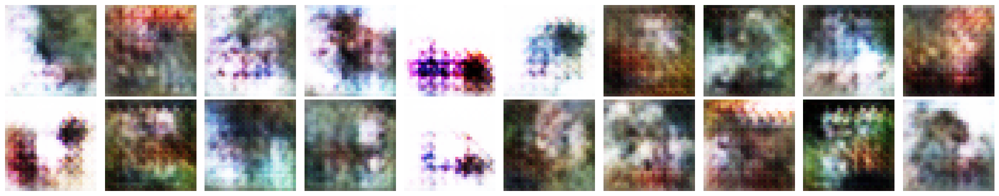

6510 [D loss: 2.4332] [G loss: 0.7146]
6520 [D loss: 1.9945] [G loss: 0.7661]
6530 [D loss: 2.7001] [G loss: 0.5153]
6540 [D loss: 3.4890] [G loss: 0.4411]
6550 [D loss: 2.4169] [G loss: 0.7555]
6560 [D loss: 2.5177] [G loss: 0.8749]
6570 [D loss: 2.5089] [G loss: 0.5229]
6580 [D loss: 3.7403] [G loss: 0.3034]
6590 [D loss: 3.5313] [G loss: 0.3351]
6600 [D loss: 2.7889] [G loss: 0.5397]


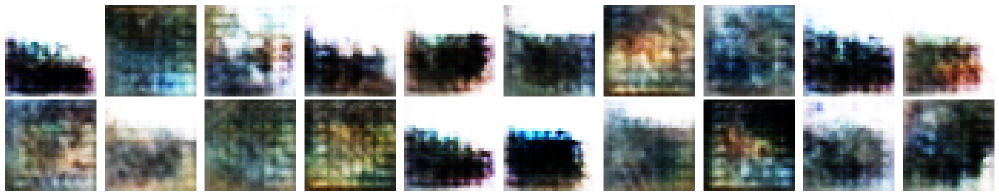

6610 [D loss: 3.0700] [G loss: 0.5650]
6620 [D loss: 3.3622] [G loss: 0.3578]
6630 [D loss: 2.6691] [G loss: 0.5554]
6640 [D loss: 2.6511] [G loss: 0.4807]
6650 [D loss: 2.3655] [G loss: 0.5215]
6660 [D loss: 2.4908] [G loss: 0.6354]
6670 [D loss: 2.5890] [G loss: 0.6291]
6680 [D loss: 2.2479] [G loss: 0.6575]
6690 [D loss: 2.7100] [G loss: 0.5710]
6700 [D loss: 3.0450] [G loss: 0.4665]


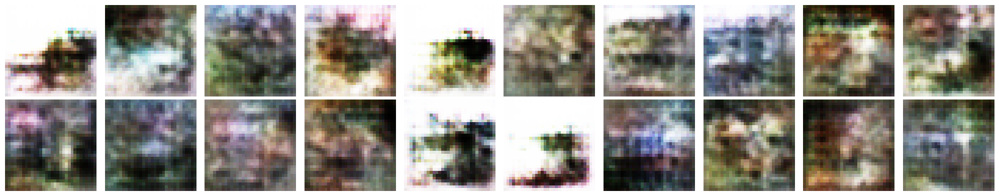

6710 [D loss: 3.1068] [G loss: 0.4027]
6720 [D loss: 2.6135] [G loss: 0.4931]
6730 [D loss: 2.5629] [G loss: 0.5607]
6740 [D loss: 2.5558] [G loss: 0.5980]
6750 [D loss: 2.3611] [G loss: 0.6070]
6760 [D loss: 2.3861] [G loss: 0.7010]
6770 [D loss: 2.4928] [G loss: 0.5646]
6780 [D loss: 2.7747] [G loss: 0.6737]
6790 [D loss: 1.9864] [G loss: 0.7726]
6800 [D loss: 2.3257] [G loss: 0.8362]


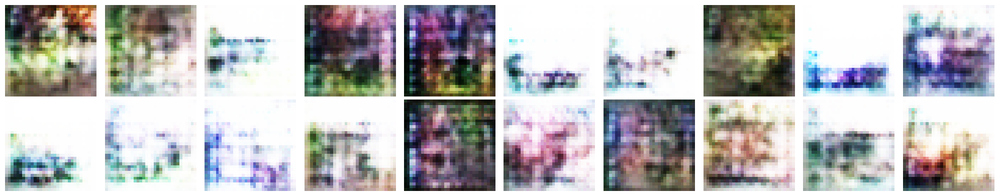

6810 [D loss: 2.4246] [G loss: 0.5816]
6820 [D loss: 2.3943] [G loss: 0.6039]
6830 [D loss: 2.6719] [G loss: 0.4956]
6840 [D loss: 3.1748] [G loss: 0.4956]
6850 [D loss: 3.1795] [G loss: 0.6126]
6860 [D loss: 2.7396] [G loss: 0.5847]
6870 [D loss: 3.2065] [G loss: 0.4105]
6880 [D loss: 3.3862] [G loss: 0.3599]
6890 [D loss: 3.2960] [G loss: 0.3649]
6900 [D loss: 2.8183] [G loss: 0.4717]


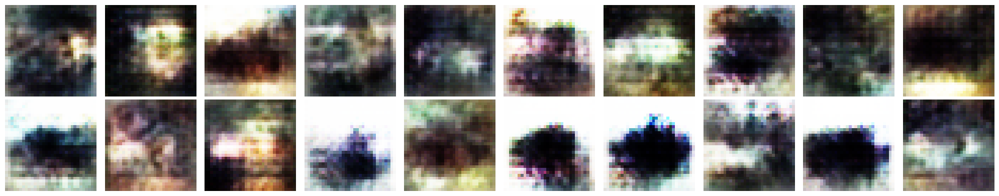

6910 [D loss: 3.1097] [G loss: 0.6176]
6920 [D loss: 2.5546] [G loss: 0.6070]
6930 [D loss: 2.9047] [G loss: 0.5548]
6940 [D loss: 3.0721] [G loss: 0.8002]
6950 [D loss: 2.0350] [G loss: 0.7133]
6960 [D loss: 2.6255] [G loss: 0.6207]
6970 [D loss: 2.3342] [G loss: 0.5961]
6980 [D loss: 2.9497] [G loss: 0.4571]
6990 [D loss: 2.4901] [G loss: 0.4814]
7000 [D loss: 2.9018] [G loss: 0.4150]


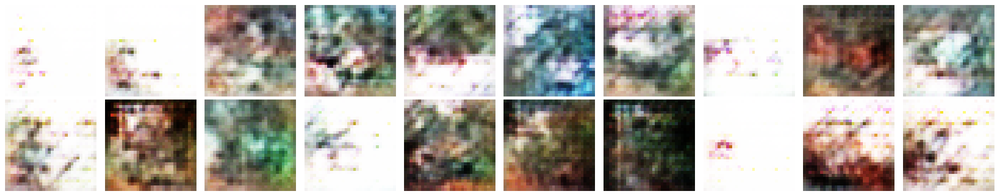

7010 [D loss: 2.7623] [G loss: 0.3795]
7020 [D loss: 2.7811] [G loss: 0.5481]
7030 [D loss: 2.9809] [G loss: 0.4557]
7040 [D loss: 2.9895] [G loss: 0.3959]
7050 [D loss: 3.0227] [G loss: 0.3680]
7060 [D loss: 2.9186] [G loss: 0.4222]
7070 [D loss: 2.6667] [G loss: 0.5150]
7080 [D loss: 2.9390] [G loss: 0.4569]
7090 [D loss: 2.6708] [G loss: 0.5189]
7100 [D loss: 2.4840] [G loss: 0.4458]


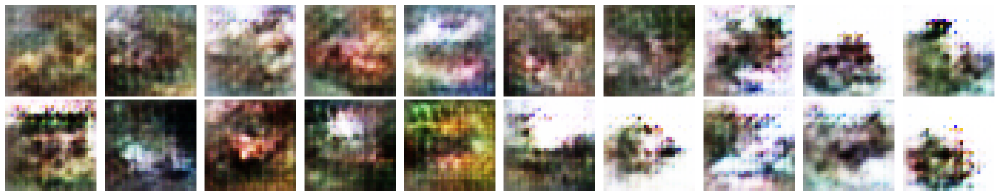

7110 [D loss: 2.8622] [G loss: 0.6376]
7120 [D loss: 2.8262] [G loss: 0.5422]
7130 [D loss: 2.6167] [G loss: 0.4923]
7140 [D loss: 2.2902] [G loss: 0.5617]
7150 [D loss: 2.4173] [G loss: 0.6282]
7160 [D loss: 2.4534] [G loss: 0.5055]
7170 [D loss: 2.9843] [G loss: 0.4178]
7180 [D loss: 3.2625] [G loss: 0.3759]
7190 [D loss: 3.0747] [G loss: 0.4646]
7200 [D loss: 2.5167] [G loss: 0.5600]


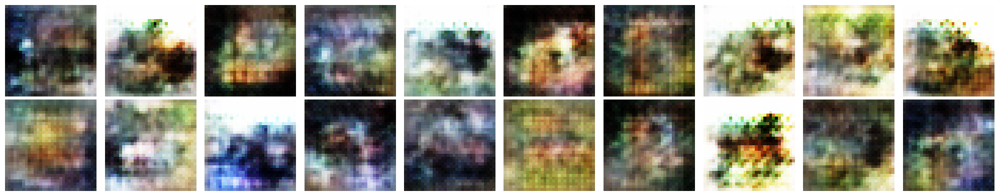

7210 [D loss: 2.7563] [G loss: 0.5828]
7220 [D loss: 2.8825] [G loss: 0.4514]
7230 [D loss: 2.9608] [G loss: 0.3909]
7240 [D loss: 3.5254] [G loss: 0.4431]
7250 [D loss: 3.2069] [G loss: 0.4415]
7260 [D loss: 3.3048] [G loss: 0.3971]
7270 [D loss: 3.3376] [G loss: 0.5628]
7280 [D loss: 2.2870] [G loss: 0.8326]
7290 [D loss: 2.6769] [G loss: 0.5309]
7300 [D loss: 3.5828] [G loss: 0.3925]


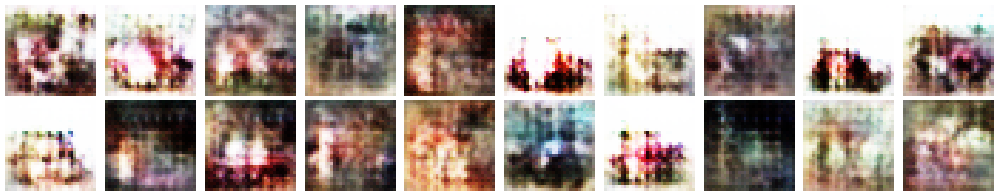

7310 [D loss: 2.9185] [G loss: 0.6182]
7320 [D loss: 3.0227] [G loss: 0.7410]
7330 [D loss: 3.2696] [G loss: 0.4752]
7340 [D loss: 2.9065] [G loss: 0.5324]
7350 [D loss: 2.4163] [G loss: 0.7471]
7360 [D loss: 3.1786] [G loss: 0.7466]
7370 [D loss: 3.2353] [G loss: 0.4723]
7380 [D loss: 2.5932] [G loss: 0.6282]
7390 [D loss: 2.9747] [G loss: 0.6436]
7400 [D loss: 2.9843] [G loss: 0.5879]


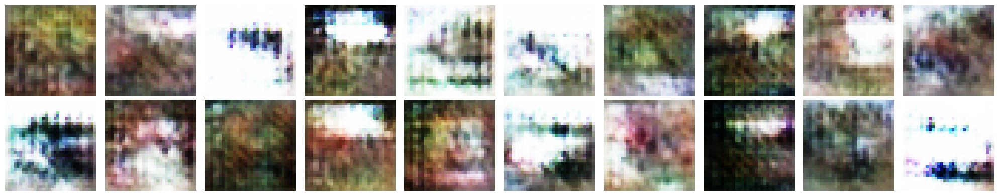

7410 [D loss: 2.9514] [G loss: 0.5578]
7420 [D loss: 2.5994] [G loss: 0.6854]
7430 [D loss: 2.3459] [G loss: 0.6904]
7440 [D loss: 2.3401] [G loss: 0.5969]
7450 [D loss: 2.6465] [G loss: 0.5437]
7460 [D loss: 2.7312] [G loss: 0.4815]
7470 [D loss: 2.6166] [G loss: 0.4529]
7480 [D loss: 2.4872] [G loss: 0.4379]
7490 [D loss: 2.6673] [G loss: 0.4808]
7500 [D loss: 2.8478] [G loss: 0.4355]


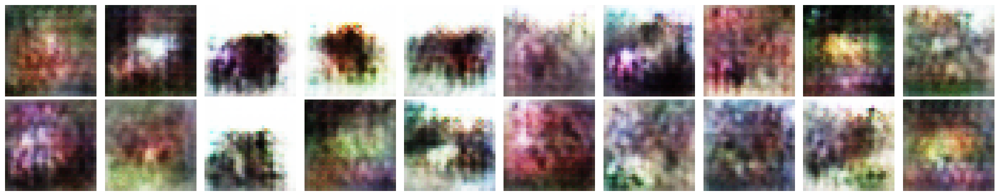

7510 [D loss: 2.5866] [G loss: 0.4952]
7520 [D loss: 2.6089] [G loss: 0.5218]
7530 [D loss: 2.1255] [G loss: 0.7255]
7540 [D loss: 2.2266] [G loss: 0.7711]
7550 [D loss: 2.3581] [G loss: 0.6769]
7560 [D loss: 2.6737] [G loss: 0.5534]
7570 [D loss: 2.6172] [G loss: 0.3634]
7580 [D loss: 2.8785] [G loss: 0.4653]
7590 [D loss: 2.5277] [G loss: 0.5080]
7600 [D loss: 2.5046] [G loss: 0.5072]


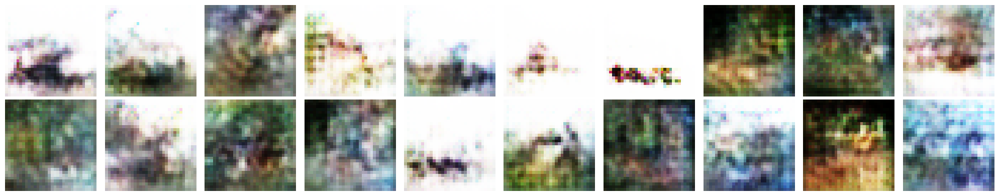

7610 [D loss: 2.8772] [G loss: 0.4427]
7620 [D loss: 2.8959] [G loss: 0.4554]
7630 [D loss: 2.2639] [G loss: 0.7290]
7640 [D loss: 2.6595] [G loss: 0.8888]
7650 [D loss: 2.2008] [G loss: 0.6941]
7660 [D loss: 2.4638] [G loss: 0.5367]
7670 [D loss: 2.8731] [G loss: 0.5026]
7680 [D loss: 2.6077] [G loss: 0.4261]
7690 [D loss: 2.5179] [G loss: 0.5361]
7700 [D loss: 2.2344] [G loss: 0.5735]


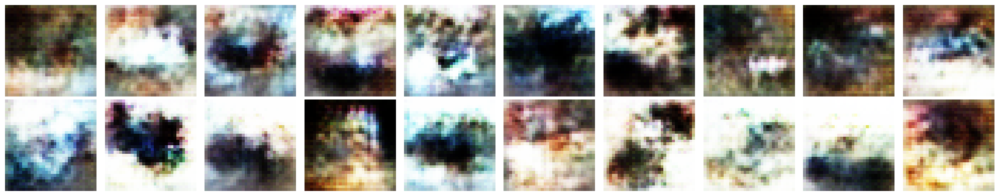

7710 [D loss: 2.7361] [G loss: 0.4017]
7720 [D loss: 2.8478] [G loss: 0.4535]
7730 [D loss: 3.0084] [G loss: 0.5895]
7740 [D loss: 2.4145] [G loss: 0.5287]
7750 [D loss: 2.6253] [G loss: 0.4038]
7760 [D loss: 2.7065] [G loss: 0.5189]
7770 [D loss: 2.4337] [G loss: 0.5589]
7780 [D loss: 2.9948] [G loss: 0.3823]
7790 [D loss: 2.9133] [G loss: 0.3505]
7800 [D loss: 2.9941] [G loss: 0.4849]


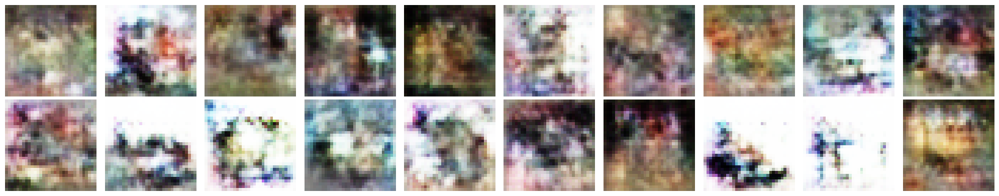

7810 [D loss: 2.7652] [G loss: 0.7615]
7820 [D loss: 2.6378] [G loss: 0.7802]
7830 [D loss: 2.3982] [G loss: 0.6708]
7840 [D loss: 2.7724] [G loss: 0.6400]
7850 [D loss: 2.7861] [G loss: 0.4640]
7860 [D loss: 2.9444] [G loss: 0.4371]
7870 [D loss: 2.8075] [G loss: 0.4863]
7880 [D loss: 2.9516] [G loss: 0.5441]
7890 [D loss: 2.7190] [G loss: 0.5693]
7900 [D loss: 2.7288] [G loss: 0.4194]


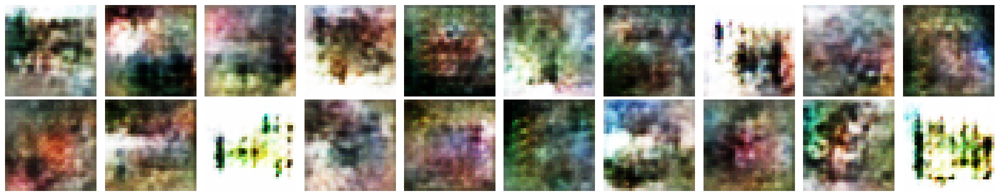

7910 [D loss: 2.8810] [G loss: 0.5135]
7920 [D loss: 2.5943] [G loss: 0.6251]
7930 [D loss: 3.3105] [G loss: 0.7070]
7940 [D loss: 2.9083] [G loss: 0.4768]
7950 [D loss: 2.6179] [G loss: 0.5693]
7960 [D loss: 2.5060] [G loss: 0.6552]
7970 [D loss: 2.7578] [G loss: 0.5984]
7980 [D loss: 2.8832] [G loss: 0.4652]
7990 [D loss: 2.6219] [G loss: 0.5374]
8000 [D loss: 2.6861] [G loss: 0.6103]


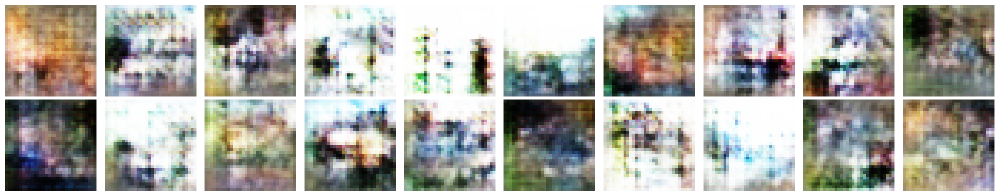

8010 [D loss: 2.8979] [G loss: 0.3879]
8020 [D loss: 2.5851] [G loss: 0.4897]
8030 [D loss: 2.7874] [G loss: 0.6021]
8040 [D loss: 2.9444] [G loss: 0.5553]
8050 [D loss: 3.0525] [G loss: 0.5753]
8060 [D loss: 2.7306] [G loss: 0.5120]
8070 [D loss: 2.9510] [G loss: 0.5340]
8080 [D loss: 2.6124] [G loss: 0.6634]
8090 [D loss: 2.5326] [G loss: 0.5955]
8100 [D loss: 2.2944] [G loss: 0.6796]


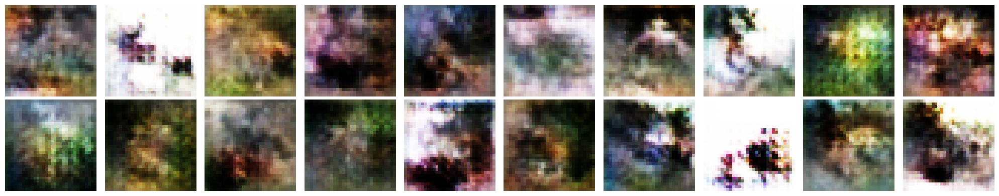

8110 [D loss: 2.2643] [G loss: 0.6433]
8120 [D loss: 2.5292] [G loss: 0.6241]
8130 [D loss: 2.2999] [G loss: 0.6234]
8140 [D loss: 2.6466] [G loss: 0.7056]
8150 [D loss: 2.5962] [G loss: 0.5820]
8160 [D loss: 2.8213] [G loss: 0.5878]
8170 [D loss: 2.4613] [G loss: 0.6409]
8180 [D loss: 2.4347] [G loss: 0.7093]
8190 [D loss: 2.2333] [G loss: 0.6360]
8200 [D loss: 2.8272] [G loss: 0.5583]


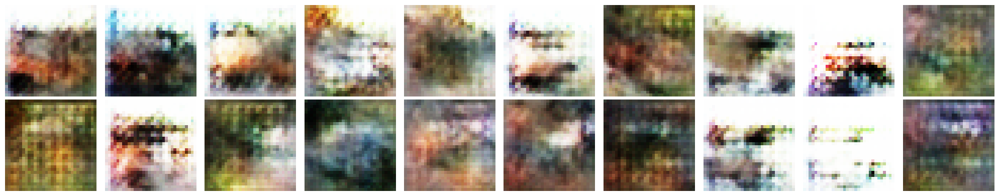

8210 [D loss: 2.1440] [G loss: 0.5492]
8220 [D loss: 2.2552] [G loss: 0.6677]
8230 [D loss: 2.7888] [G loss: 0.5395]
8240 [D loss: 2.8511] [G loss: 0.4537]
8250 [D loss: 2.4652] [G loss: 0.5565]
8260 [D loss: 2.7541] [G loss: 0.6731]
8270 [D loss: 2.7757] [G loss: 0.6193]
8280 [D loss: 2.5291] [G loss: 0.4588]
8290 [D loss: 2.8229] [G loss: 0.5806]
8300 [D loss: 2.5703] [G loss: 0.4838]


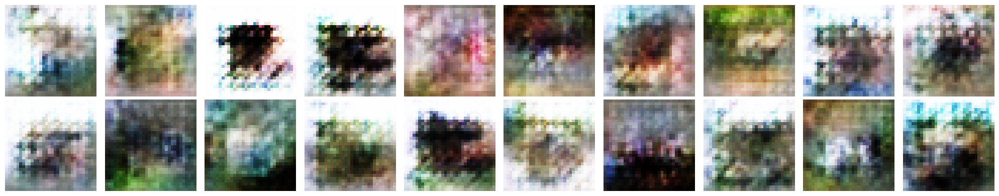

8310 [D loss: 3.0255] [G loss: 0.3214]
8320 [D loss: 2.5577] [G loss: 0.5971]
8330 [D loss: 2.5706] [G loss: 0.7989]
8340 [D loss: 2.5303] [G loss: 0.5920]
8350 [D loss: 2.7797] [G loss: 0.5770]
8360 [D loss: 2.2827] [G loss: 0.7367]
8370 [D loss: 2.5922] [G loss: 0.5459]
8380 [D loss: 2.8132] [G loss: 0.5320]
8390 [D loss: 2.8475] [G loss: 0.4563]
8400 [D loss: 2.8320] [G loss: 0.4588]


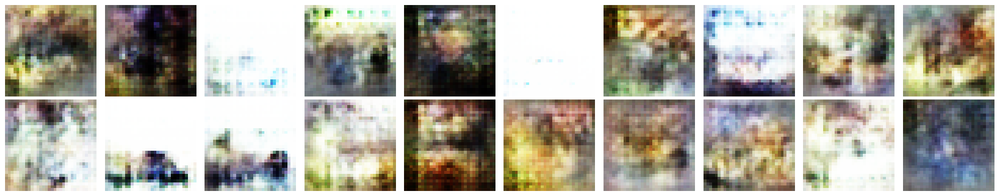

8410 [D loss: 2.8106] [G loss: 0.4160]
8420 [D loss: 2.9471] [G loss: 0.4812]
8430 [D loss: 3.1216] [G loss: 0.4616]
8440 [D loss: 3.1997] [G loss: 0.5949]
8450 [D loss: 2.8896] [G loss: 0.7104]
8460 [D loss: 2.6099] [G loss: 0.7024]
8470 [D loss: 2.6295] [G loss: 0.6925]
8480 [D loss: 2.4408] [G loss: 0.6572]
8490 [D loss: 2.7904] [G loss: 0.5945]
8500 [D loss: 2.7513] [G loss: 0.6133]


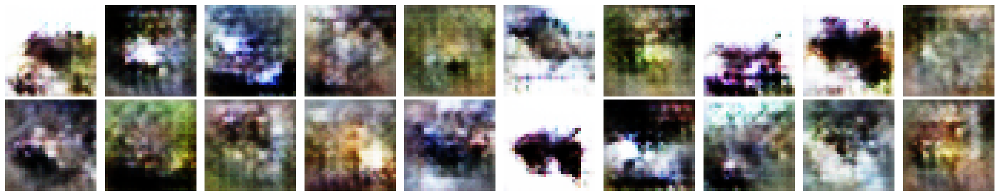

8510 [D loss: 3.0017] [G loss: 0.4295]
8520 [D loss: 2.8202] [G loss: 0.4988]
8530 [D loss: 2.9268] [G loss: 0.5394]
8540 [D loss: 2.8057] [G loss: 0.5324]
8550 [D loss: 3.2995] [G loss: 0.4879]
8560 [D loss: 2.7449] [G loss: 0.5292]
8570 [D loss: 2.5616] [G loss: 0.5183]
8580 [D loss: 2.6337] [G loss: 0.3900]
8590 [D loss: 2.4459] [G loss: 0.5368]
8600 [D loss: 2.2670] [G loss: 0.6209]


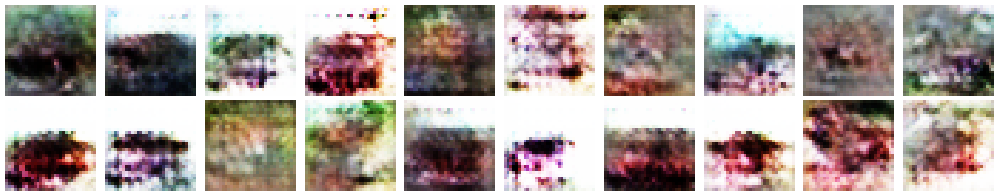

8610 [D loss: 2.9425] [G loss: 0.4449]
8620 [D loss: 3.0641] [G loss: 0.4881]
8630 [D loss: 3.3067] [G loss: 0.5580]
8640 [D loss: 2.2385] [G loss: 0.6489]
8650 [D loss: 2.2811] [G loss: 0.7598]
8660 [D loss: 2.0760] [G loss: 0.6890]
8670 [D loss: 2.2185] [G loss: 0.5878]
8680 [D loss: 2.5094] [G loss: 0.6200]
8690 [D loss: 2.7743] [G loss: 0.5086]
8700 [D loss: 3.0068] [G loss: 0.4596]


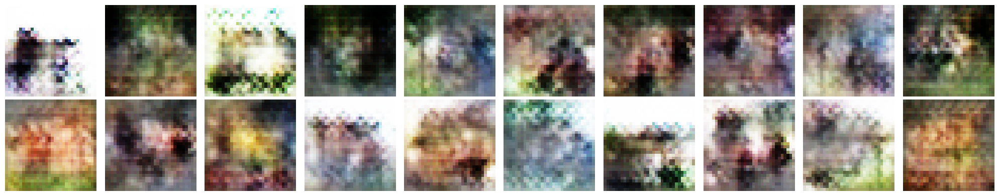

8710 [D loss: 2.7620] [G loss: 0.6603]
8720 [D loss: 2.2580] [G loss: 0.6451]
8730 [D loss: 2.9604] [G loss: 0.5277]
8740 [D loss: 3.0950] [G loss: 0.4624]
8750 [D loss: 3.0544] [G loss: 0.4442]
8760 [D loss: 3.3699] [G loss: 0.5165]
8770 [D loss: 2.7386] [G loss: 0.5410]
8780 [D loss: 2.7351] [G loss: 0.5908]
8790 [D loss: 2.8631] [G loss: 0.5276]
8800 [D loss: 3.1451] [G loss: 0.4160]


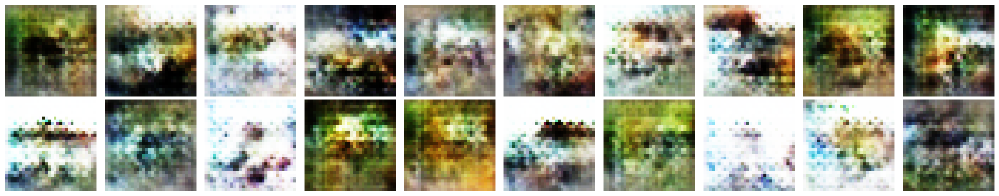

8810 [D loss: 2.9185] [G loss: 0.5837]
8820 [D loss: 2.8508] [G loss: 0.5480]
8830 [D loss: 2.7565] [G loss: 0.5036]
8840 [D loss: 2.5760] [G loss: 0.6339]
8850 [D loss: 2.5271] [G loss: 0.6306]
8860 [D loss: 2.6131] [G loss: 0.5775]
8870 [D loss: 2.4571] [G loss: 0.5560]
8880 [D loss: 2.7647] [G loss: 0.4423]
8890 [D loss: 2.8927] [G loss: 0.5700]
8900 [D loss: 2.5440] [G loss: 0.6225]


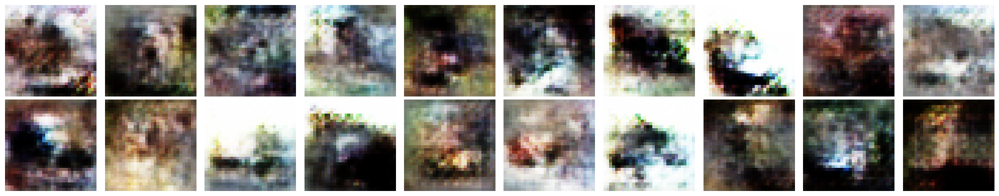

8910 [D loss: 2.4771] [G loss: 0.6864]
8920 [D loss: 2.1525] [G loss: 0.6811]
8930 [D loss: 2.1961] [G loss: 0.6324]
8940 [D loss: 2.6042] [G loss: 0.5533]
8950 [D loss: 2.3464] [G loss: 0.6530]
8960 [D loss: 2.1783] [G loss: 0.5586]
8970 [D loss: 2.2669] [G loss: 0.5840]
8980 [D loss: 2.4590] [G loss: 0.5132]
8990 [D loss: 2.4600] [G loss: 0.5048]
9000 [D loss: 2.7295] [G loss: 0.4411]


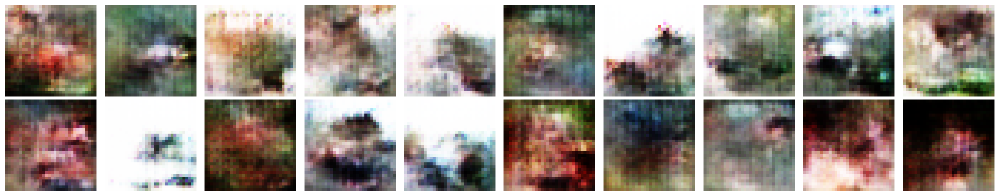

9010 [D loss: 2.4503] [G loss: 0.5613]
9020 [D loss: 2.2613] [G loss: 0.8575]
9030 [D loss: 2.1702] [G loss: 0.8309]
9040 [D loss: 2.8528] [G loss: 0.5305]
9050 [D loss: 2.4572] [G loss: 0.5634]
9060 [D loss: 2.8546] [G loss: 0.6855]
9070 [D loss: 2.4267] [G loss: 0.5669]
9080 [D loss: 2.5293] [G loss: 0.7171]
9090 [D loss: 2.9875] [G loss: 0.6426]
9100 [D loss: 2.6662] [G loss: 0.4989]


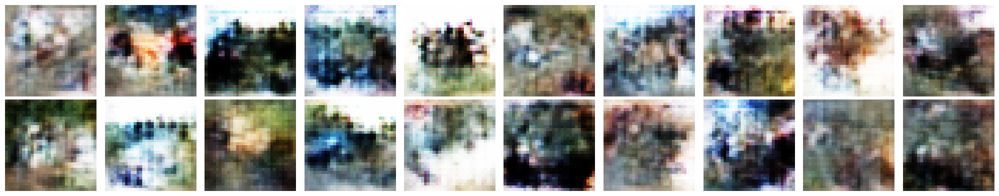

9110 [D loss: 3.3221] [G loss: 0.4637]
9120 [D loss: 3.2818] [G loss: 0.4713]
9130 [D loss: 2.7278] [G loss: 0.4952]
9140 [D loss: 2.5904] [G loss: 0.5978]
9150 [D loss: 2.6468] [G loss: 0.6132]
9160 [D loss: 2.4650] [G loss: 0.6602]
9170 [D loss: 2.5587] [G loss: 0.6417]
9180 [D loss: 2.6811] [G loss: 0.6776]
9190 [D loss: 2.6277] [G loss: 0.6559]
9200 [D loss: 3.2636] [G loss: 0.4903]


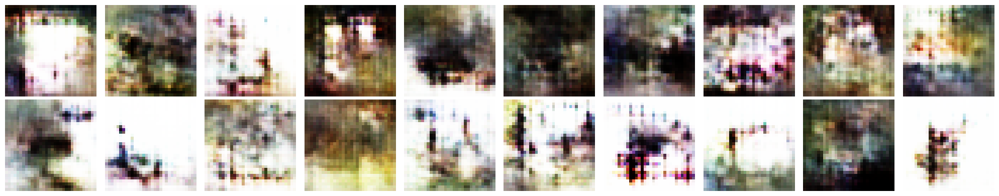

9210 [D loss: 2.8515] [G loss: 0.4310]
9220 [D loss: 3.1630] [G loss: 0.4893]
9230 [D loss: 2.8192] [G loss: 0.5370]
9240 [D loss: 2.7276] [G loss: 0.5562]
9250 [D loss: 2.3879] [G loss: 0.7795]
9260 [D loss: 2.6556] [G loss: 0.6944]
9270 [D loss: 3.0328] [G loss: 0.5217]
9280 [D loss: 2.2841] [G loss: 0.7858]
9290 [D loss: 2.4275] [G loss: 0.8397]
9300 [D loss: 2.3950] [G loss: 0.6100]


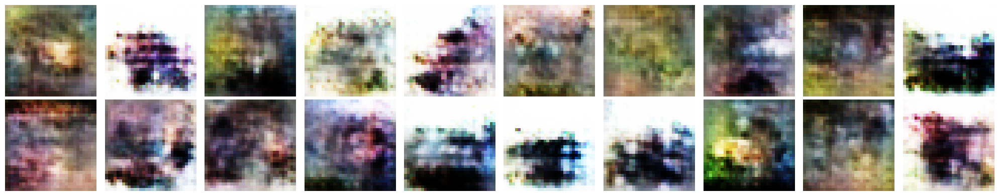

9310 [D loss: 2.7684] [G loss: 0.4218]
9320 [D loss: 2.2778] [G loss: 0.5741]
9330 [D loss: 2.4756] [G loss: 0.6456]
9340 [D loss: 2.7049] [G loss: 0.4996]
9350 [D loss: 2.6336] [G loss: 0.4456]
9360 [D loss: 2.5627] [G loss: 0.6637]
9370 [D loss: 2.3469] [G loss: 0.7575]
9380 [D loss: 2.5219] [G loss: 0.6015]
9390 [D loss: 2.3225] [G loss: 0.6506]
9400 [D loss: 2.3676] [G loss: 0.7529]


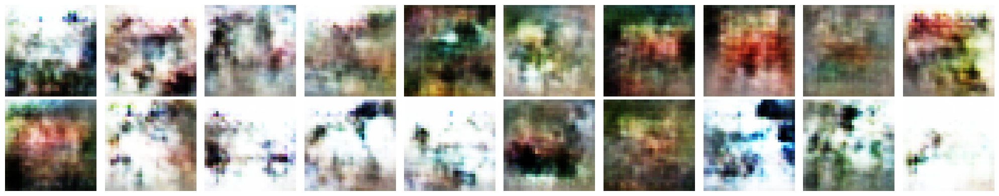

9410 [D loss: 2.5828] [G loss: 0.7253]
9420 [D loss: 2.4663] [G loss: 0.6794]
9430 [D loss: 2.5867] [G loss: 0.5708]
9440 [D loss: 2.4577] [G loss: 0.6857]
9450 [D loss: 2.5901] [G loss: 0.6449]
9460 [D loss: 2.4487] [G loss: 0.6386]
9470 [D loss: 2.4989] [G loss: 0.5565]
9480 [D loss: 2.5869] [G loss: 0.6021]
9490 [D loss: 2.7844] [G loss: 0.4846]
9500 [D loss: 2.9010] [G loss: 0.4006]


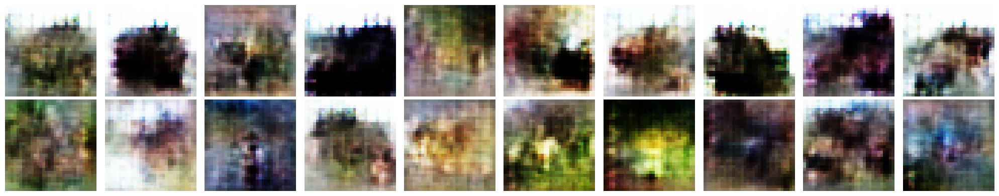

9510 [D loss: 2.9000] [G loss: 0.4679]
9520 [D loss: 2.3243] [G loss: 0.5143]
9530 [D loss: 2.2206] [G loss: 0.5805]
9540 [D loss: 2.4203] [G loss: 0.6160]
9550 [D loss: 2.3176] [G loss: 0.6142]
9560 [D loss: 2.3437] [G loss: 0.6904]
9570 [D loss: 2.0939] [G loss: 0.7109]
9580 [D loss: 2.6227] [G loss: 0.6292]
9590 [D loss: 3.2655] [G loss: 0.4948]
9600 [D loss: 2.9052] [G loss: 0.5181]


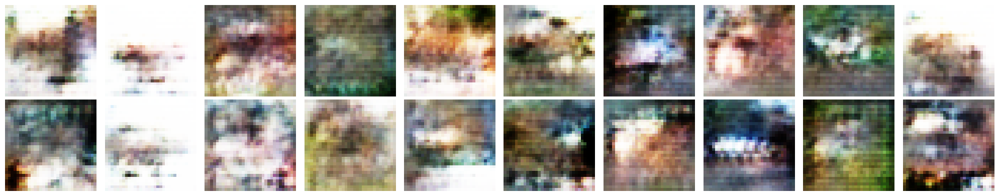

9610 [D loss: 2.9568] [G loss: 0.5619]
9620 [D loss: 3.0127] [G loss: 0.5857]
9630 [D loss: 2.7008] [G loss: 0.6757]
9640 [D loss: 2.4977] [G loss: 0.6292]
9650 [D loss: 2.5449] [G loss: 0.6314]
9660 [D loss: 2.4066] [G loss: 0.7313]
9670 [D loss: 2.4570] [G loss: 0.5589]
9680 [D loss: 2.0631] [G loss: 0.5992]
9690 [D loss: 2.0931] [G loss: 0.5490]
9700 [D loss: 2.4113] [G loss: 0.5492]


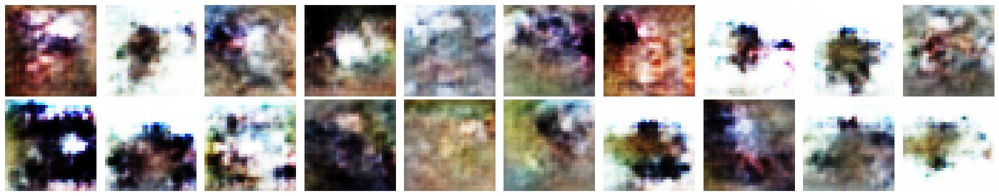

9710 [D loss: 2.4200] [G loss: 0.6777]
9720 [D loss: 3.0386] [G loss: 0.5856]
9730 [D loss: 3.0368] [G loss: 0.4960]
9740 [D loss: 2.6710] [G loss: 0.5603]
9750 [D loss: 2.6700] [G loss: 0.7021]
9760 [D loss: 2.6748] [G loss: 0.5239]
9770 [D loss: 2.9000] [G loss: 0.4954]
9780 [D loss: 2.5015] [G loss: 0.7716]
9790 [D loss: 2.3723] [G loss: 0.5327]
9800 [D loss: 2.8139] [G loss: 0.4028]


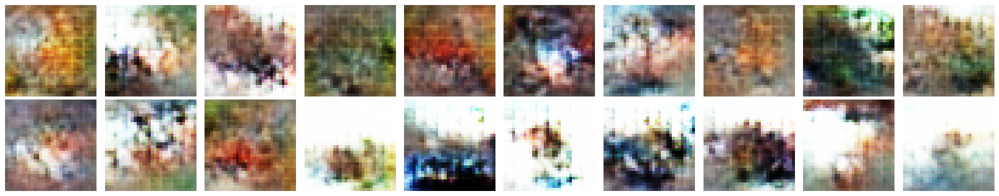

9810 [D loss: 2.5410] [G loss: 0.5045]
9820 [D loss: 2.7121] [G loss: 0.5641]
9830 [D loss: 2.5885] [G loss: 0.5780]
9840 [D loss: 2.4889] [G loss: 0.6332]
9850 [D loss: 2.4924] [G loss: 0.6439]
9860 [D loss: 2.4484] [G loss: 0.7507]
9870 [D loss: 2.3184] [G loss: 0.5934]
9880 [D loss: 2.2157] [G loss: 0.5397]
9890 [D loss: 2.2338] [G loss: 0.4886]
9900 [D loss: 2.3417] [G loss: 0.6117]


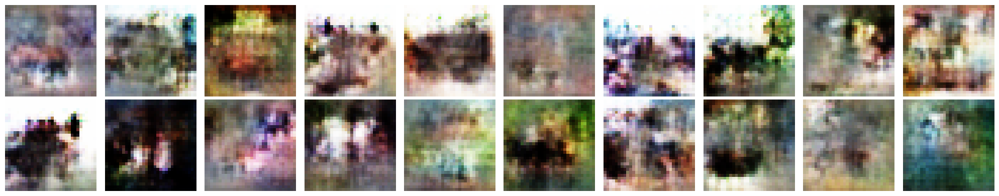

9910 [D loss: 2.1581] [G loss: 0.7293]
9920 [D loss: 2.3474] [G loss: 0.6188]
9930 [D loss: 1.9620] [G loss: 0.7110]
9940 [D loss: 1.9835] [G loss: 0.7429]
9950 [D loss: 1.9295] [G loss: 0.6913]
9960 [D loss: 2.3920] [G loss: 0.4417]
9970 [D loss: 2.4044] [G loss: 0.4456]
9980 [D loss: 2.9329] [G loss: 0.5574]
9990 [D loss: 2.5136] [G loss: 0.5328]
Training finished in 4604.55s


In [10]:
import time

epochs = 10000
start_time = time.time()

for epoch in range(epochs):
    batch_imgs = next(train_iterator)
    d_loss, g_loss = train_step(batch_imgs)
    
    if epoch % 10 == 0:
        print (f"{epoch} [D loss: {d_loss:.4f}] [G loss: {g_loss:.4f}]")

    if epoch % 100 == 0:
        print_imgs()
        
print(f"Training finished in {time.time() - start_time:.2f}s")